In [25]:
import pandas as pd
import numpy as np
np.set_printoptions(precision=5)
import datetime as dt
import scipy
from scipy.stats import norm
from scipy.special import ndtri
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [4]:
# Statsのコード from 吉田さん
def format_float(panda, num):
    new = pd.DataFrame(index = panda.index, columns = panda.columns)
    name = '{:.' + str(num) + 'f}'
    for i in new.index:
        for j in new.columns: new.at[i,j] = name.format(panda.at[i,j])
    return new

def performance_stats(rets):
    outs = ['Ret%','Std%','DDBMax%','DDBMed%','TuWMax','TuWMed',
            'SR','Skew','Kurt','Corr',
            'hit%','AvgHit%','AvgLos%']
    outs_mat = pd.DataFrame(index=outs, columns=rets.columns)
    ret_pct = rets.pct_change().dropna()
    ret_pct_M = rets.resample('1M').last().pct_change().dropna()
    outs_mat.loc['Ret%',:] = (np.exp(np.log(ret_pct_M + 1.).mean()*12)-1)*100
    outs_mat.loc['Std%',:] = (ret_pct_M.std(ddof=0) * np.sqrt(12)
                              * 100.).replace(0, 0.01)
    DD_flow = rets / rets.cummax()
    outs_mat.loc['DDBMax%',:] = (1.-DD_flow.min())*100.
    outs_mat.loc['DDBMed%',:] = (1.-DD_flow.median())*100.
    DD_count = (DD_flow < (1. - 1e-10)).astype(int)
    DD_range = pd.DataFrame(0, index=rets.index, columns=rets.columns)
    iter_num = len(DD_range) - 1
    for i in range(iter_num):
        prev, now = rets.index[[i,i+1]]
        DD_range.loc[now,:] = (DD_range.loc[prev,:]+1) * DD_count.loc[prev,:]
    outs_mat.loc['TuWMax',:] = DD_range.max() / 21
    outs_mat.loc['TuWMed',:] = DD_range.median() / 21
    outs_mat.loc['SR',:] = outs_mat.loc['Ret%',:] / outs_mat.loc['Std%',:]
    outs_mat.loc['Skew',:] = ret_pct_M.skew()
    outs_mat.loc['Kurt',:] = ret_pct_M.kurt()
    outs_mat.loc['Corr',:] = ret_pct.corr().iloc[-1,:]
    outs_mat.loc['hit%',:] = ((ret_pct_M > 0).sum() / len(ret_pct_M)) * 100. ##len(ret_pct_M[ret_pct_M!=0])
    outs_mat.loc['AvgHit%',:] = ((ret_pct_M * (ret_pct_M > 0)).sum() /(ret_pct_M > 0).sum()) * 100. 
    outs_mat.loc['AvgLos%',:] = ((ret_pct_M * (ret_pct_M < 0)).sum() /(ret_pct_M < 0).sum()) * 100.
    out_put = format_float(outs_mat, 2)
    return out_put

In [5]:
# リターンのインデックス化コード
def index(dataset):
    dataset_index = dataset.copy()
    dataset_index.iloc[0] = 100*(dataset.iloc[0]+1)
    for i in range(1,len(dataset_index)) :
        dataset_index.iloc[i]=(dataset_index.iloc[i]+1)*dataset_index.iloc[i-1]
    return dataset_index

In [6]:
data_MSCI = pd.read_excel("MSCI.xlsx",sheet_name="Sheet2",index_col=0,parse_dates=True)
data_MSCI_log_return = (np.log(data_MSCI)-np.log(data_MSCI.shift(1)))
data_MSCI_log_return = data_MSCI_log_return[(data_MSCI_log_return.index >= dt.datetime(1998,12,31)) & (data_MSCI_log_return.index <= dt.datetime(2017,5,31))]
data_MSCI_log_return = data_MSCI_log_return.dropna(how='all').dropna(how='any',axis=1)

In [7]:
data_MSCI_log_return

,NDDUCA Index,NDDUUS Index,NDDUFR Index,NDEUSCH Index,NDEUCHF Index,NDDUAS Index,NDEUSCO Index,NDEUSCZ Index,NDDUGRE Index,NDDUHK Index,NDEUSHG Index,NDEUSIA Index,NDDUJN Index,NDEUMXF Index,NDDUNZ Index,NDEUSRU Index,NDDUSG Index,NDEUSSA Index,NDEUSTW Index,NDDUUK Index
1999-01-01,0.000000,0.000000,-0.000313,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000260,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001633
1999-01-04,0.020107,-0.001153,0.052855,0.013771,-0.019368,0.017966,0.006786,0.013800,0.076436,-0.022444,0.011044,0.022825,-0.020422,-0.019268,0.004910,0.005633,-0.009838,0.000572,0.002096,-0.003279
1999-01-05,0.024395,0.013031,0.009968,0.000334,-0.010866,-0.005022,-0.002497,0.009082,0.004354,0.005631,0.000734,0.012360,-0.006633,-0.016784,0.044427,0.026289,-0.025334,0.025421,-0.044263,0.012659
1999-01-06,0.034656,0.022038,0.015906,0.005687,0.027922,0.026738,0.002238,0.036237,-0.005870,0.033961,-0.003967,0.019826,0.000622,-0.015927,0.012998,0.046632,0.045958,0.074425,0.017279,0.030691
1999-01-07,-0.005140,-0.000444,-0.018186,-0.015892,0.022135,0.021027,-0.011028,-0.017510,0.039166,0.039458,0.088254,0.026881,0.023220,-0.013985,0.028561,-0.002783,0.044419,-0.021075,0.038881,-0.012872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-05-25,-0.000012,0.004489,0.003011,0.009103,0.011737,0.004465,-0.002689,0.002243,0.020238,0.001355,0.009655,0.014615,0.003748,0.006233,0.005418,0.000381,0.004053,0.002123,0.011085,-0.000259
2017-05-26,-0.000640,0.000392,-0.002245,0.003028,0.000169,-0.009556,0.002450,-0.000341,0.005314,0.000645,-0.003991,0.014783,0.000309,0.002534,0.000768,-0.018163,-0.003372,0.001252,-0.001756,-0.008303
2017-05-29,0.001905,0.000000,-0.001069,-0.005151,0.001772,-0.008704,0.001330,0.000064,-0.009586,0.005346,-0.010071,-0.001216,0.000117,-0.007360,-0.001537,0.011718,-0.003580,-0.012286,0.000000,0.004018
2017-05-30,-0.004982,-0.001039,-0.002116,0.000147,-0.001167,0.004086,-0.006664,-0.004307,-0.007412,0.000423,0.008845,0.001974,0.003843,-0.011340,0.001126,-0.008108,-0.003383,-0.009909,0.000000,-0.001180


In [33]:
class Path_Prediction():

  

    def __init__(self,P,z,alpha,w,v,n_p,className): #Methods
        self.R = [] # a list that will contain a sample of observed log-returns for a given asset at a given trading frequency
        self.P = P # a list that will contain positive integer numbers candidate values for the parameter n of the classifier being implemented
        self.z = z # an integer corresponding to the desired learning sample size, to be used by methods Classify and Update.
        self.alpha = alpha # the significance threshold for the application of the signed path dependence test
        self.w = w # an integer number corresponding to a retuning interval
        self.v = v # an integer number corresponding to a retraining interval
        self.className = className # MA or DMA
        self.countSinceTune = 0 # storing how many data points have been read since the last time the classifier was tuned
        self.countSinceTrain = 0 # storing how many data points have been read since the last time the classifier was trained
        self.count = 0
        self.n_p = n_p # an integer number corresponding to a test lookback horizon
        print("List P is :",self.P)
    
    def Classify(self,r_t): #This is the only public method of the class. It should be called every time t a new data point has become available and returns either s(t + 1) or zero, which also can be taken as a trading decision
        self.R.append(r_t) # Append r(t) to the end of list self.R , r(t): the observed data point (log-return)

        if len(self.R) > self.z:
            self.R.pop(0) # Drop the first element of list self.R
      
        if len(self.R) == self.z:
            self.Update()
            print("bTrade : ",self.bTrade)
            if self.bTrade == True:
                if self.count == 0:
                    self.n_max = self.P[0]
                    return self.Predict(self.R,self.r_,self.n_max) # Return -1 or 1
                print("self.count:",self.count)
                return self.Predict(self.R,self.r_,self.n_max)
            else:
                return 0    
    
    
    def Predict(self,R,r_,n):
        
        sum_ = 0
        for i in range(n):
            sum_ += R[len(R)-1-i]-r_
        sign_sum = np.sign(sum_) # -1 or 0 or 1

        return self.Ita*sign_sum #return either -1 or 1
    
    def Null_hypothesis(self):
   
        W = [0]*len(self.R) # len(self.R) = z
        D = [0]*len(self.R)
        for j in range(self.n_p,len(self.R)): # j: 5~999
            w_t_sum = 0
            w_t_sum_sign = 0
            for i in range(1,self.n_p+1): # w_t = sgn(r(t-1))+sgn(r(t-1)+r(t-2))+sgn(r(t-1)+r(t-2)+r(t-3))+sgn(r(t-1)+r(t-2)+r(t-3)+r(t-4)+sgn(r(t-1)+r(t-2)+r(t-3)+r(t-4)+r(t-5))
                w_t_sum += self.R[j-i]
                w_t_sum_sign += np.sign(w_t_sum)
            W[j] = w_t_sum_sign/self.n_p
            D[j] = self.R[j]*W[j]
                
        D_sum = 0
        for i in range(self.n_p,len(D)):
            D_sum += D[i]
        D_average = D_sum/(len(D)-self.n_p) # Hの分子
    
    
    ########################################################
        sum = 0
        for j in range(-self.n_p+1,self.n_p): # j : -4~4
            for i in range(self.n_p,len(self.R)-self.n_p): # i : 5~994
                sum += ((D[i]-D_average)*(D[i-abs(j)]-D_average))/(len(D)-self.n_p)**2
            
        H_down = np.sqrt(sum) # Hの分母
    #########################################################
    
    
        H_R = D_average / H_down # Hの分子/Hの分母
        
        if self.className == "DMA":
            print("abs(H_R) : ",abs(H_R))
            print(" ndtri(1-self.alpha/2) : ",ndtri(1-self.alpha/2))
            
        elif self.className == "MA":
            print("H_R : ",H_R)
            print(" ndtri(1-self.alpha) : ",ndtri(1-self.alpha))

        return H_R
        
    def Update(self):
        
        print("--------------------------------------------------------------")
        print("Start Update")
        self.countSinceTune = self.countSinceTune +1
        self.countSinceTrain = self.countSinceTrain +1
        print("self.countSinceTune:",self.countSinceTune)
        print("self.countSinceTrain:",self.countSinceTrain)

        if self.countSinceTune == self.w: # The tuning stage is performed inside this block // In the paper w was 6 months
            #self.r_ = sum(self.R[:self.z])/len(self.R[:self.z])
            self.r_ = sum(self.R)/len(self.R)

            if (self.className == "MA") & (self.Null_hypothesis() > ndtri(1-self.alpha)):
                self.bTrade = True
                self.Ita = 1

            elif (self.className == "DMA") & (abs(self.Null_hypothesis()) > ndtri(1-self.alpha/2)):
                self.bTrade = True
                if self.Null_hypothesis() > ndtri(1-self.alpha/2):
                    self.Ita = 1
                elif self.Null_hypothesis() < ndtri(self.alpha/2):
                    self.Ita = -1
                print("bTrade is True under DMA")
                    
            else:
                self.bTrade = False
                self.Ita = 1 ## When no signal was detected, we need to decide initial self.Ita for further computation to renew n_max
                print("bTrade is False")
                
            self.countSinceTune = 0
            
            

        if self.countSinceTrain == self.v: # The training stage is performed inside this block // In the paper v was one month
                self.count = 1
                print("Training Stage is working")
                r_1 = sum(self.R[:round(self.z/2)])/len(self.R[:round(self.z/2)])
                P_Classification_Gain = []
                for n in self.P:
                    sum_classification = 0
                    for i in range(round(self.z/2),self.z):
                        sum_classification += np.exp(self.R[i]*self.Predict(self.R[i-round(self.z/2):i],r_1,n))
                        #print(self.Predict(self.R[i-round(self.z/2):i],r_1,n))
                    P_Classification_Gain.append(sum_classification/(round(self.z/2))) ## Predict using R = ((r(t−1), r(t−2), ..., r(t−z/2)),r_,n)

                    
                P_Classification_Gain_np = np.array(P_Classification_Gain)
                n_max_index = np.argmax(P_Classification_Gain) ## n_max that maximize the classification gain 
                n_max = self.P[n_max_index]
                print("self.P :",self.P)
                print("P_Classification_Gain :",P_Classification_Gain_np)
                print("n_max : ",n_max)
                self.n_max = n_max
                self.countSinceTrain = 0
                print("Training Stage is Done")
                print("---------------------------------------------------------")
            
            
            


In [35]:
# Stats 入れる/ 取引回数 / トレード
np.random.seed(1)
P_1 = np.random.randint(1,20,5)
np.random.seed(2)
P_2 = np.random.randint(50,100,5)
np.random.seed(3) ## 2-3 months as lookback?
P_3 = np.random.randint(20,60,5)
P_4 = [20,30,40,50]
P_5 = [20,25,30,35,40,45,50,55,60]
P_3_test = [44,44,44,44,44]
#P_3 np.random.randint(1,21,5)
US_MSCI_data = data_MSCI_log_return['NDDUUS Index']
JP_MSCI_data = data_MSCI_log_return['NDDUJN Index']
UK_MSCI_data = data_MSCI_log_return['NDDUUK Index']
FR_MSCI_data = data_MSCI_log_return['NDDUFR Index']
HK_MSCI_data = data_MSCI_log_return['NDDUHK Index']
SG_MSCI_data = data_MSCI_log_return['NDDUSG Index']
CA_MSCI_data = data_MSCI_log_return['NDDUCA Index'] 
CHILE_MSCI_data = data_MSCI_log_return['NDEUSCH Index']
CH_MSCI_data = data_MSCI_log_return['NDEUCHF Index']
AUS_MSCI_data = data_MSCI_log_return['NDDUAS Index']
IND_MSCI_data = data_MSCI_log_return['NDEUSIA Index']
COL_MSCI_data = data_MSCI_log_return['NDEUSCO Index']
SouthAF_MSCI_data = data_MSCI_log_return['NDEUSSA Index']
print("P_1 :",P_1)
print("P_2 :",P_2)
print("P_3 :",P_2)
z = 2412 # z =2412 from literature
P = P_4
alpha = 0.05
w = 1
v = 20
n_p = 60 # test loockback horizon

## List P = [44 44 44 44 44 44]
## Debug / 

P_1 : [ 6 12 13  9 10]
P_2 : [90 65 95 58 72]
P_3 : [90 65 95 58 72]


In [16]:
UK_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_UK = []
Prediction_result_UK = pd.DataFrame(index=UK_MSCI_data.index,columns=['Predicted Path']) #NDDUUK Index
for i in UK_MSCI_data:
    Prediction_UK.append(UK_Class.Classify(i))
for j in range(len(UK_MSCI_data.index)):
    Prediction_result_UK.iloc[j] = Prediction_UK[j]
Prediction_result_UK = Prediction_result_UK.shift(1)[z:]

List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  1.0683000198762473
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.0683000198762473
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  1.1029100632747328
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.1029100632747328
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  1.0989377107991596
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.0989377107991596
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
----------------------------------------------------

In [36]:
US_Class = Path_Prediction(P_4,z,alpha,w,v,n_p,'DMA')
Prediction_US = []
Prediction_result_US = pd.DataFrame(index=US_MSCI_data.index,columns=['Predicted Path']) #NDDUUS Index
for i in US_MSCI_data:
    Prediction_US.append(US_Class.Classify(i))
for j in range(len(US_MSCI_data)):
    Prediction_result_US.iloc[j] = Prediction_US[j]
Prediction_result_US = Prediction_result_US.shift(1)[z:]

List P is : [20, 30, 40, 50]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  1.4394617728889076
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.4394617728889076
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  1.5001694462290864
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.5001694462290864
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  1.5326004215187514
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.5326004215187514
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------

In [41]:
JP_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_JP = []
Prediction_result_JP = pd.DataFrame(index=JP_MSCI_data.index,columns=['Predicted Path']) #NDDUJP Index
for i in JP_MSCI_data:
    Prediction_JP.append(JP_Class.Classify(i))
for j in range(len(JP_MSCI_data)):
    Prediction_result_JP.iloc[j] = Prediction_JP[j]
Prediction_result_JP = Prediction_result_JP.shift(1)[z:]

List P is : [20, 30, 40, 50]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  0.0821637646319126
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  0.0821637646319126
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  0.07664639400132237
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  0.07664639400132237
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  0.11432150487429818
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  0.11432150487429818
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
----------------------------------------------------

In [30]:
FR_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_FR = []
Prediction_result_FR = pd.DataFrame(index=FR_MSCI_data.index,columns=['Predicted Path']) #NDDUFR Index
for i in FR_MSCI_data:
    Prediction_FR.append(FR_Class.Classify(i))
for j in range(len(FR_MSCI_data)):
    Prediction_result_FR.iloc[j] = Prediction_FR[j]
Prediction_result_FR = Prediction_result_FR.shift(1)[z:]

List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  1.5744772721108595
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.5744772721108595
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  1.5265085375877556
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.5265085375877556
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  1.5104433458600808
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.5104433458600808
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
----------------------------------------------------

In [36]:
HK_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_HK = []
Prediction_result_HK = pd.DataFrame(index=HK_MSCI_data.index,columns=['Predicted Path']) #NDDUHK Index
for i in HK_MSCI_data:
    Prediction_HK.append(HK_Class.Classify(i))
for j in range(len(HK_MSCI_data)):
    Prediction_result_HK.iloc[j] = Prediction_HK[j]
Prediction_result_HK = Prediction_result_HK.shift(1)[z:]

List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  2.367844854861407
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.367844854861407
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.367844854861407
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is True
bTrade :  True
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  2.3479075572711854
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.3479075572711854
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.3479075572711854
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is True
bTrade :  True
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  2.395614860825698
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.395

In [41]:
SG_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_SG = []
Prediction_result_SG = pd.DataFrame(index=SG_MSCI_data.index,columns=['Predicted Path']) #NDDUSG Index
for i in SG_MSCI_data:
    Prediction_SG.append(SG_Class.Classify(i))
for j in range(len(SG_MSCI_data)):
    Prediction_result_SG.iloc[j] = Prediction_SG[j]
Prediction_result_SG = Prediction_result_SG.shift(1)[z:]
    


List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  3.0030281579081146
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  3.0030281579081146
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  3.0030281579081146
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is True
bTrade :  True
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  2.957375226901648
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.957375226901648
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  2.957375226901648
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is True
bTrade :  True
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  3.002222840662039
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  3.002

In [47]:
CA_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_CA = []
Prediction_result_CA = pd.DataFrame(index=CA_MSCI_data.index,columns=['Predicted Path']) #NDDUCA Index
for i in CA_MSCI_data:
    Prediction_CA.append(CA_Class.Classify(i))
for j in range(len(CA_MSCI_data)):
    Prediction_result_CA.iloc[j] = Prediction_CA[j]
Prediction_result_CA = Prediction_result_CA.shift(1)[z:]

List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  1.7609207693265436
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.7609207693265436
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  1.7488255265667716
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.7488255265667716
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  1.7525495710425674
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.7525495710425674
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
----------------------------------------------------

In [52]:
AUS_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_AUS = []
Prediction_result_AUS = pd.DataFrame(index=AUS_MSCI_data.index,columns=['Predicted Path']) #NDDUAUS Index
for i in AUS_MSCI_data:
    Prediction_AUS.append(AUS_Class.Classify(i))
for j in range(len(AUS_MSCI_data)):
    Prediction_result_AUS.iloc[j] = Prediction_AUS[j]
Prediction_result_AUS = Prediction_result_AUS.shift(1)[z:]

List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  1.3350534267041185
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.3350534267041185
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  1.3744472598790511
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.3744472598790511
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  1.264232024481948
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  1.264232024481948
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is False
bTrade :  False
------------------------------------------------------

In [60]:
CH_Class = Path_Prediction(P,z,alpha,w,v,n_p,'DMA')
Prediction_CH = []
Prediction_result_CH = pd.DataFrame(index=CH_MSCI_data.index,columns=['Predicted Path']) #NDDUCH Index
for i in CH_MSCI_data:
    Prediction_CH.append(CH_Class.Classify(i))
for j in range(len(CH_MSCI_data)):
    Prediction_result_CH.iloc[j] = Prediction_CH[j]
Prediction_result_CH = Prediction_result_CH.shift(1)[z:]

List P is : [20, 30, 40, 50, 60]
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 1
abs(H_R) :  4.660913447439899
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  4.660913447439899
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  4.660913447439899
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is True
bTrade :  True
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 2
abs(H_R) :  4.6436736785632275
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  4.6436736785632275
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  4.6436736785632275
 ndtri(1-self.alpha/2) :  1.959963984540054
bTrade is True
bTrade :  True
--------------------------------------------------------------
Start Update
self.countSinceTune: 1
self.countSinceTrain: 3
abs(H_R) :  4.692386580064205
 ndtri(1-self.alpha/2) :  1.959963984540054
abs(H_R) :  4.692

In [18]:
Prediction_result_UK

,Predicted Path
2008-04-01,0
2008-04-02,0
2008-04-03,0
2008-04-04,0
2008-04-07,0
...,...
2017-05-25,0
2017-05-26,0
2017-05-29,0
2017-05-30,0


In [17]:
UK = Prediction_result_UK.copy()
UK["Actual Return"] = UK_MSCI_data
UK["Expected Return"] = UK['Predicted Path']*UK['Actual Return']
UK["Expected Return Index"]= index(UK["Expected Return"])
UK["Buy & Hold"] = index(UK[UK["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(UK["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUUK, alpha=0.05",fontsize=15)

IndexError: single positional indexer is out-of-bounds

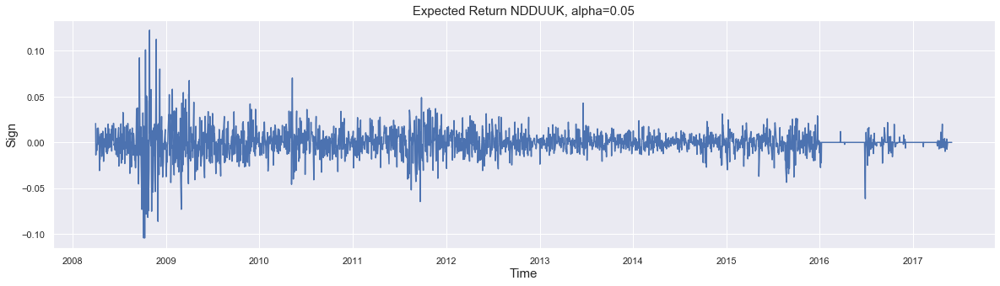

In [16]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUUK, alpha=0.05",fontsize=15)
g_1_2.plot(UK['Expected Return'])

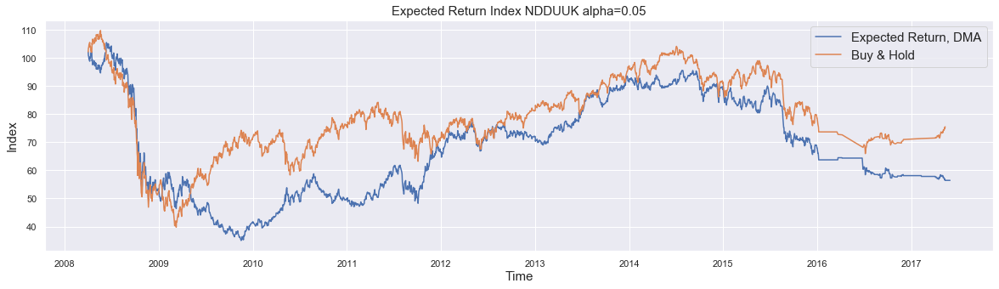

In [17]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUUK alpha=0.05",fontsize=15)
g_1_3.plot(UK["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(UK[UK["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [18]:
accuracy = len(UK[UK["Expected Return"] > 0])/ (len(UK[UK["Expected Return"] < 0])+len(UK[UK["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.4978622327790974


/Users/seungjuseo/.pyenv/versions/3.7.1/envs/myenv/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Predicted Path NDDUUS, alpha=0.05')

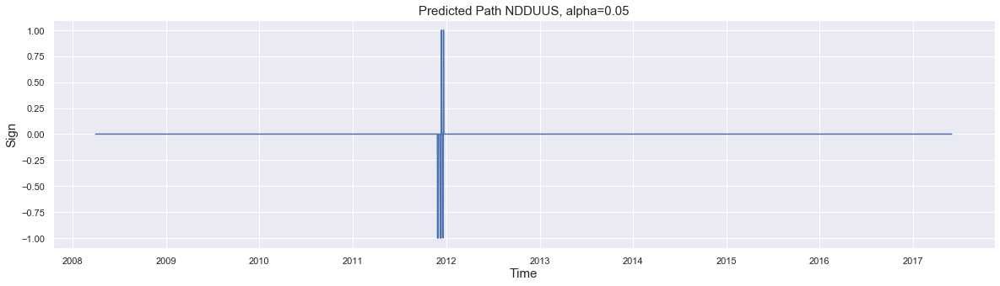

In [37]:
US = Prediction_result_US.copy()
US["Actual Return"] = US_MSCI_data
US["Expected Return"] = US['Predicted Path']*US['Actual Return']
US["Expected Return Index"]= index(US["Expected Return"])
US["Buy & Hold"] = index(US[US["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(US["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUUS, alpha=0.05",fontsize=15)

In [38]:
accuracy = len(US[US["Expected Return"] > 0])/ (len(US[US["Expected Return"] < 0])+len(US[US["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5


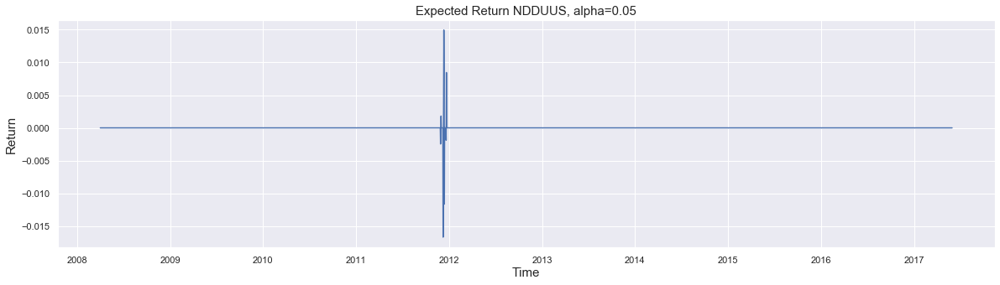

In [39]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Return",fontsize=15)
g_1_2.set_title("Expected Return NDDUUS, alpha=0.05",fontsize=15)
g_1_2.plot(US['Expected Return'])

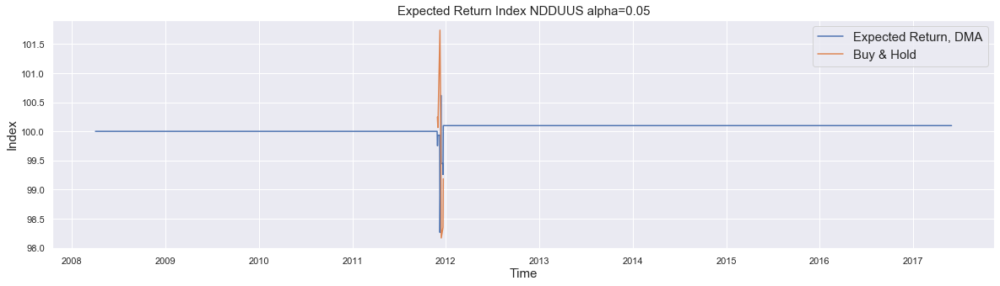

In [40]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUUS alpha=0.05",fontsize=15)
g_1_3.plot(US["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(US[US["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [1]:
accuracy = len(US[US["Expected Return"] > 0])/ (len(US[US["Expected Return"] < 0])+len(US[US["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

NameError: name 'US' is not defined

Text(0.5, 1.0, 'Predicted Path NDDUJP, alpha=0.05')

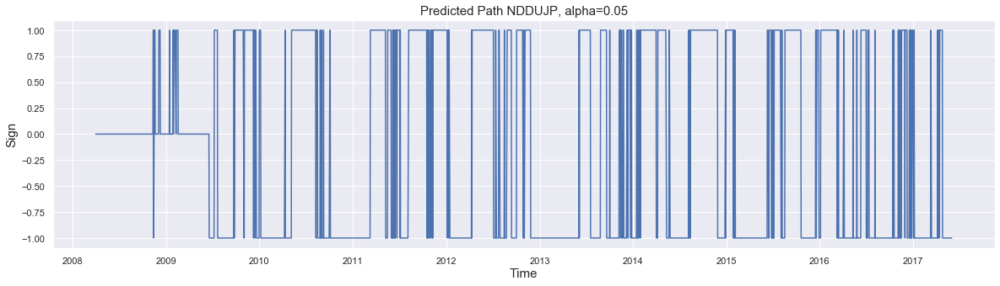

In [26]:
JP = Prediction_result_JP.copy()
JP["Actual Return"] = JP_MSCI_data
JP["Expected Return"] = JP['Predicted Path']*JP['Actual Return']
JP["Expected Return Index"]= index(JP["Expected Return"])
JP["Buy & Hold"] = index(JP[JP["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(JP["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUJP, alpha=0.05",fontsize=15)

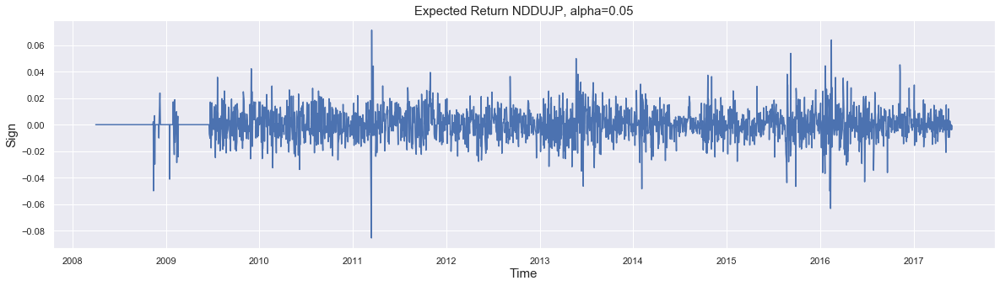

In [27]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUJP, alpha=0.05",fontsize=15)
g_1_2.plot(JP['Expected Return'])

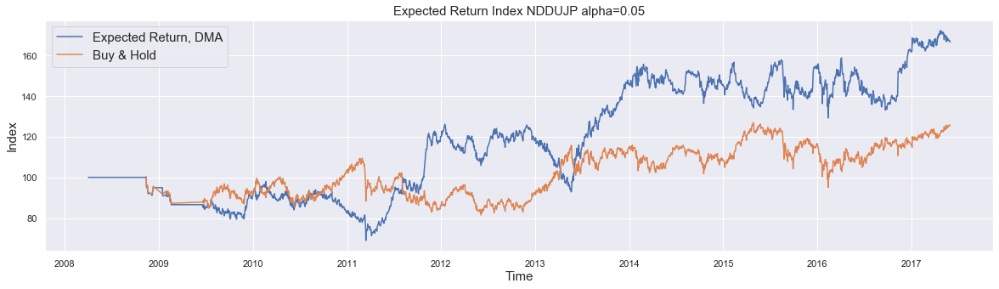

In [28]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUJP alpha=0.05",fontsize=15)
g_1_3.plot(JP["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(JP[JP["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [29]:
accuracy = len(JP[JP["Expected Return"] > 0])/ (len(JP[JP["Expected Return"] < 0])+len(JP[JP["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5150789851603638


Text(0.5, 1.0, 'Predicted Path NDDUFR, alpha=0.05')

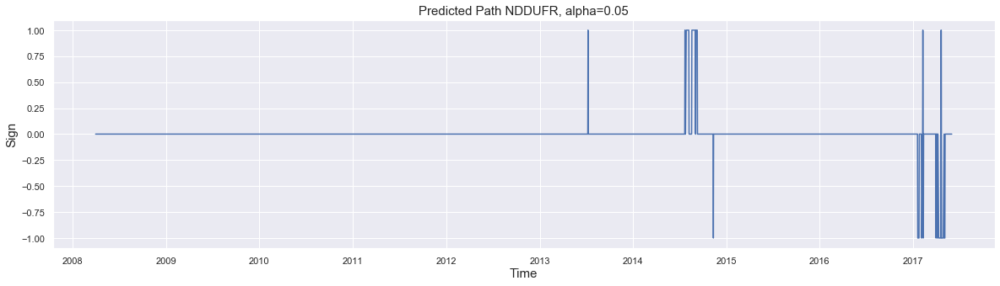

In [32]:
FR = Prediction_result_FR.copy()
FR["Actual Return"] = FR_MSCI_data
FR["Expected Return"] = FR['Predicted Path']*FR['Actual Return']
FR["Expected Return Index"]= index(FR["Expected Return"])
FR["Buy & Hold"] = index(FR[FR["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(FR["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUFR, alpha=0.05",fontsize=15)

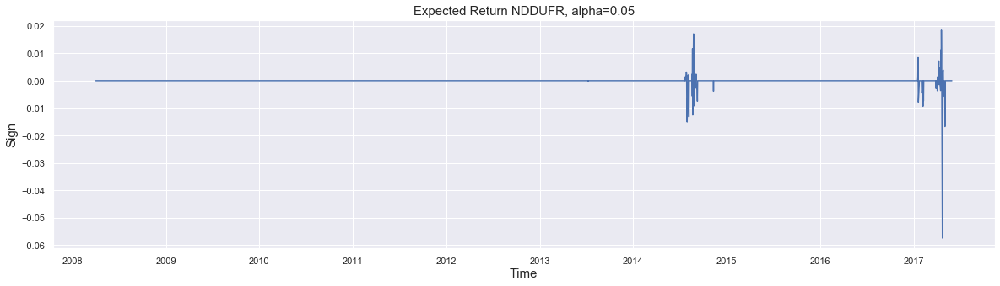

In [33]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUFR, alpha=0.05",fontsize=15)
g_1_2.plot(FR['Expected Return'])

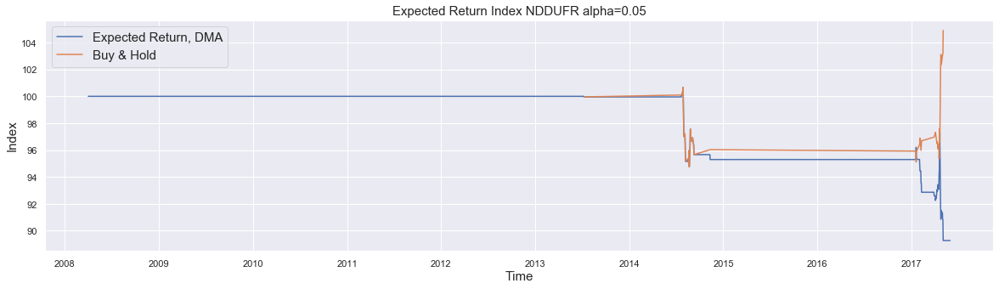

In [34]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUFR alpha=0.05",fontsize=15)
g_1_3.plot(FR["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(FR[FR["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [35]:
accuracy = len(FR[FR["Expected Return"] > 0])/ (len(FR[FR["Expected Return"] < 0])+len(FR[FR["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.42592592592592593


Text(0.5, 1.0, 'Predicted Path NDDUHK, alpha=0.05')

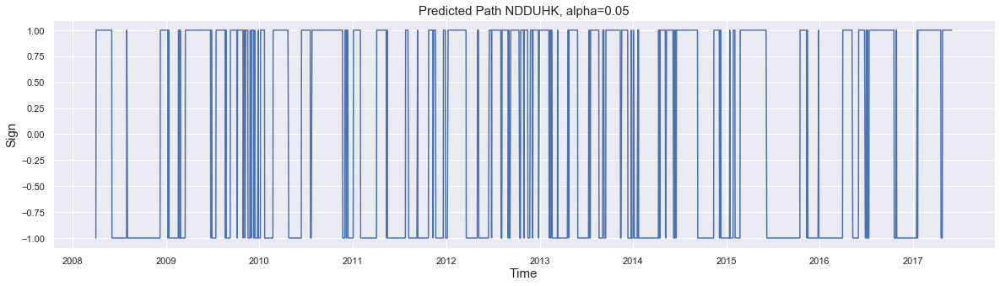

In [37]:
HK = Prediction_result_HK.copy()
HK["Actual Return"] = HK_MSCI_data
HK["Expected Return"] = HK['Predicted Path']*HK['Actual Return']
HK["Expected Return Index"]= index(HK["Expected Return"])
HK["Buy & Hold"] = index(HK[HK["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(HK["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUHK, alpha=0.05",fontsize=15)

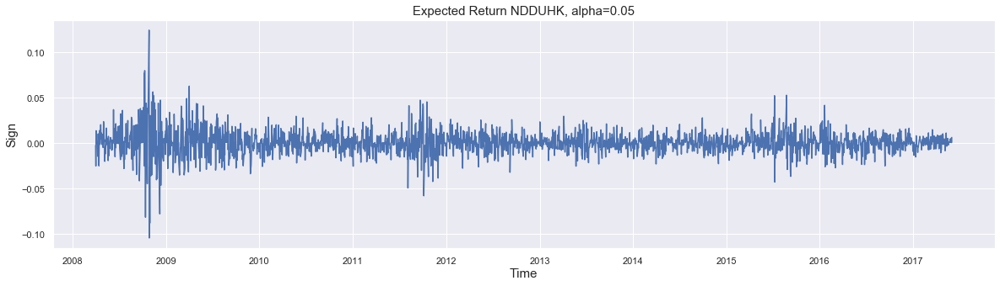

In [38]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUHK, alpha=0.05",fontsize=15)
g_1_2.plot(HK['Expected Return'])

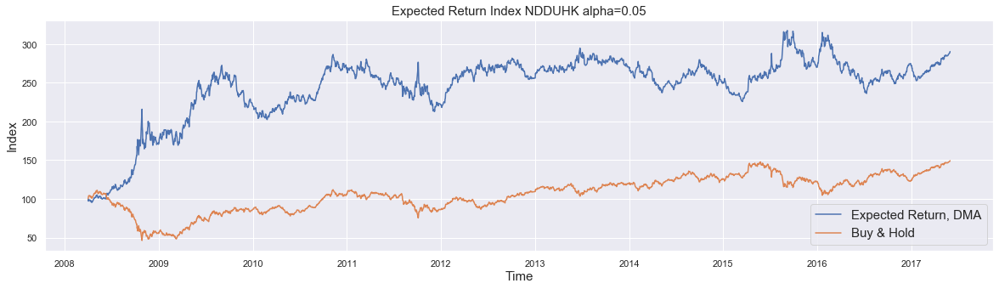

In [39]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUHK alpha=0.05",fontsize=15)
g_1_3.plot(HK["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(HK[HK["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [40]:
accuracy = len(HK[HK["Expected Return"] > 0])/ (len(HK[HK["Expected Return"] < 0])+len(HK[HK["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5186282811176969


Text(0.5, 1.0, 'Predicted Path NDDUSG, alpha=0.05')

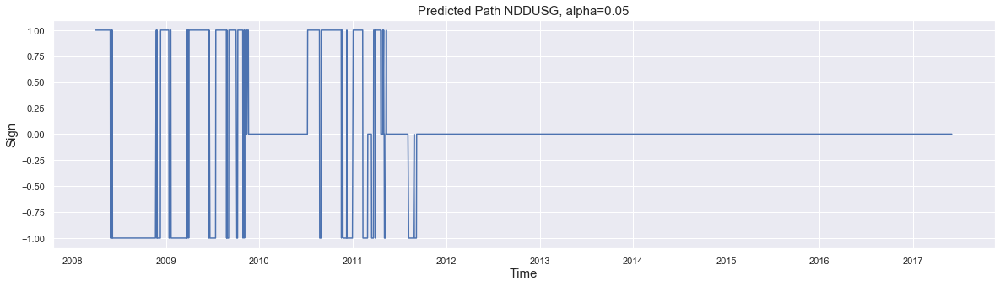

In [43]:
SG = Prediction_result_SG.copy()
SG["Actual Return"] = SG_MSCI_data
SG["Expected Return"] = SG['Predicted Path']*SG['Actual Return']
SG["Expected Return Index"]= index(SG["Expected Return"])
SG["Buy & Hold"] = index(SG[SG["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(SG["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUSG, alpha=0.05",fontsize=15)

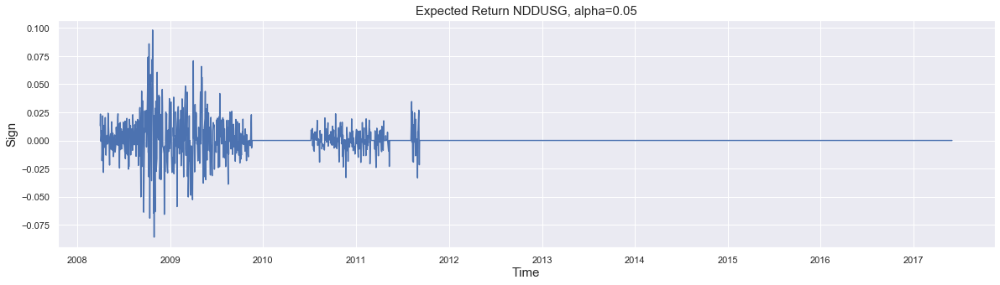

In [44]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUSG, alpha=0.05",fontsize=15)
g_1_2.plot(SG['Expected Return'])

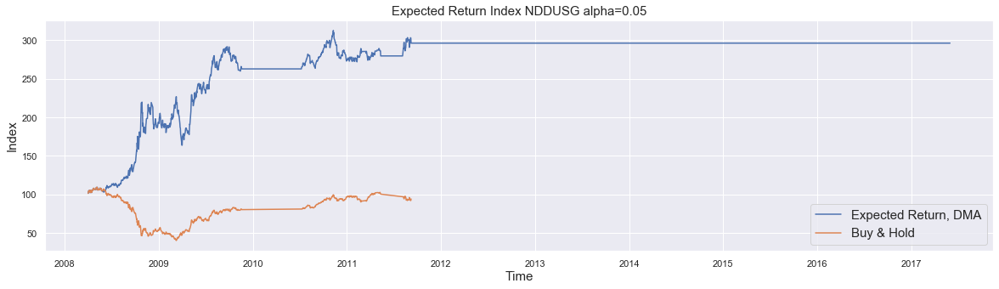

In [45]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUSG alpha=0.05",fontsize=15)
g_1_3.plot(SG["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(SG[SG["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [46]:
accuracy = len(SG[SG["Expected Return"] > 0])/ (len(SG[SG["Expected Return"] < 0])+len(SG[SG["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5382215288611545


Text(0.5, 1.0, 'Predicted Path NDDUCA, alpha=0.05')

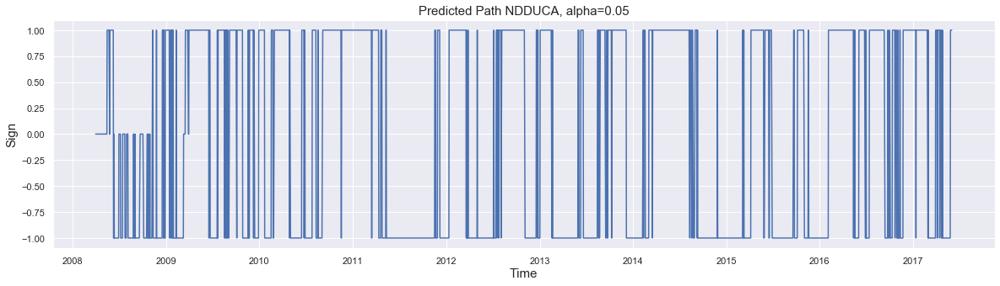

In [48]:
CA = Prediction_result_CA.copy()
CA["Actual Return"] = CA_MSCI_data
CA["Expected Return"] = CA['Predicted Path']*CA['Actual Return']
CA["Expected Return Index"]= index(CA["Expected Return"])
CA["Buy & Hold"] = index(CA[CA["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(CA["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUCA, alpha=0.05",fontsize=15)

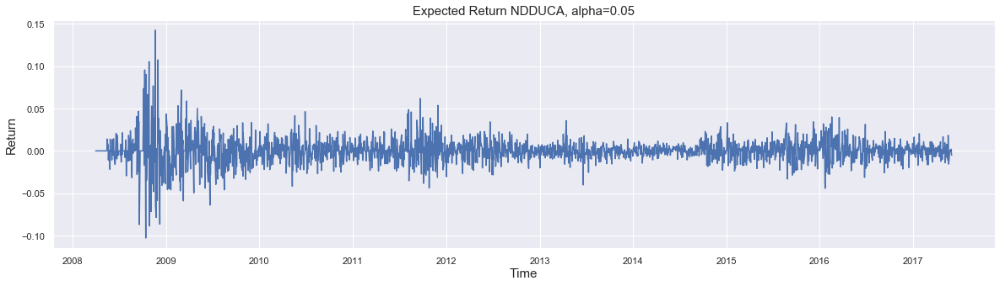

In [49]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Return",fontsize=15)
g_1_2.set_title("Expected Return NDDUCA, alpha=0.05",fontsize=15)
g_1_2.plot(CA['Expected Return'])

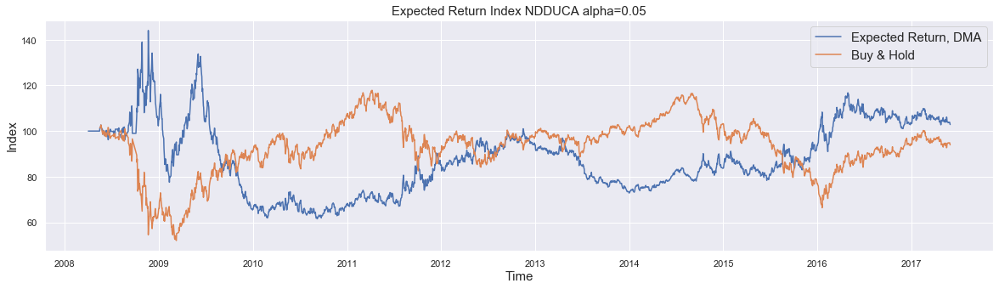

In [50]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUCA alpha=0.05",fontsize=15)
g_1_3.plot(CA["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(CA[CA["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [51]:
accuracy = len(CA[CA["Expected Return"] > 0])/ (len(CA[CA["Expected Return"] < 0])+len(CA[CA["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5126527050610821


In [58]:
Prediction_result_AUS

,Predicted Path
2008-04-01,0
2008-04-02,0
2008-04-03,0
2008-04-04,0
2008-04-07,0
...,...
2017-05-25,0
2017-05-26,0
2017-05-29,0
2017-05-30,0


Text(0.5, 1.0, 'Predicted Path NDDUAUS, alpha=0.05')

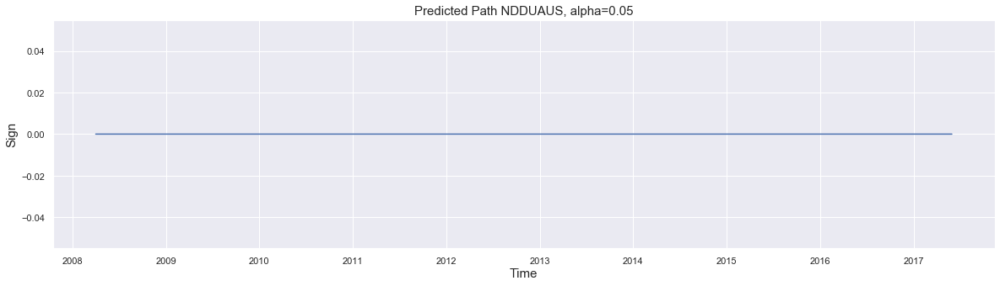

In [59]:
AUS = Prediction_result_AUS.copy()
AUS["Actual Return"] = AUS_MSCI_data
AUS["Expected Return"] = AUS['Predicted Path']*AUS['Actual Return']
AUS["Expected Return Index"]= index(AUS["Expected Return"])
#AUS["Buy & Hold"] = index(AUS[AUS["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(AUS["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUAUS, alpha=0.05",fontsize=15)

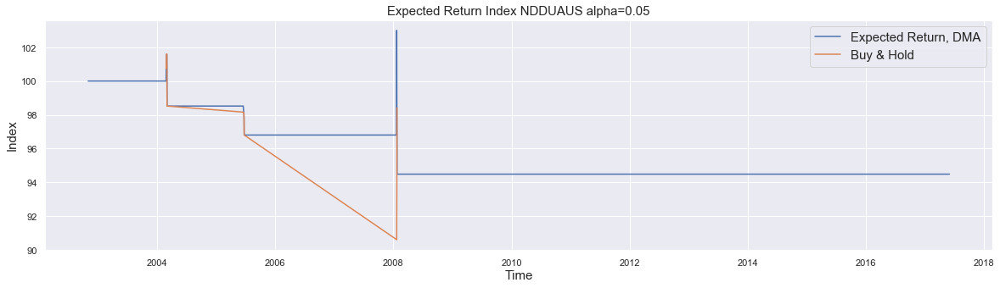

In [112]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUAUS alpha=0.05",fontsize=15)
g_1_3.plot(AUS["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(AUS[AUS["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

Text(0.5, 1.0, 'Predicted Path CH, alpha=0.05')

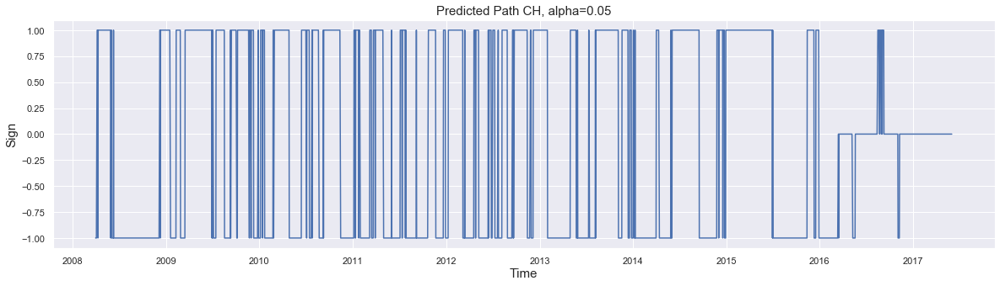

In [61]:
CH = Prediction_result_CH.copy()
CH["Actual Return"] = CH_MSCI_data
CH["Expected Return"] = CH['Predicted Path']*CH['Actual Return']
CH["Expected Return Index"]= index(CH["Expected Return"])
CH["Buy & Hold"] = index(CH[CH["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(CH["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path CH, alpha=0.05",fontsize=15)

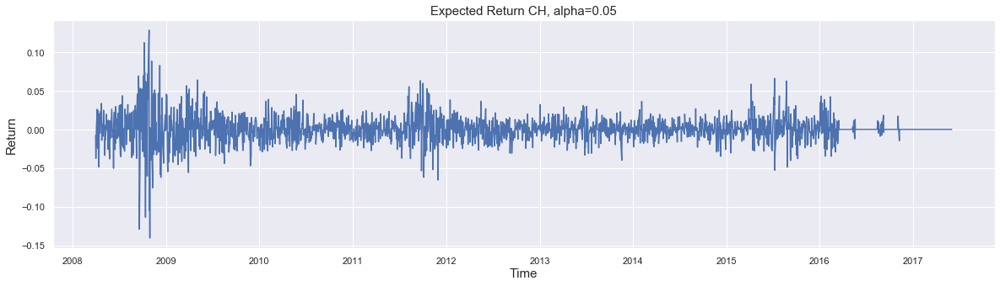

In [62]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Return",fontsize=15)
g_1_2.set_title("Expected Return CH, alpha=0.05",fontsize=15)
g_1_2.plot(CH['Expected Return'])

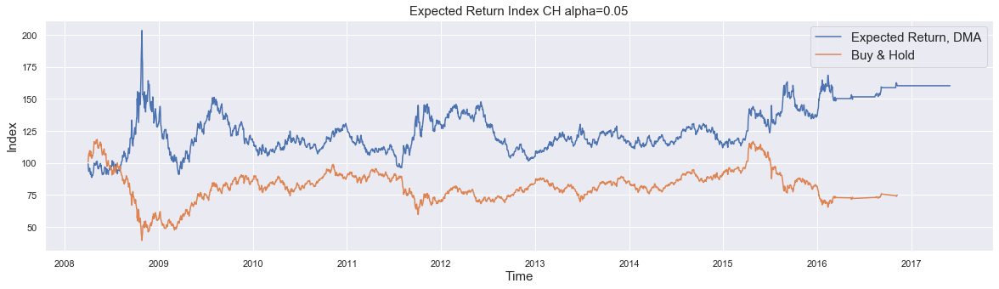

In [63]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index CH alpha=0.05",fontsize=15)
g_1_3.plot(CH["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(CH[CH["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

Text(0.5, 1.0, 'Predicted Path, alpha=0.05')

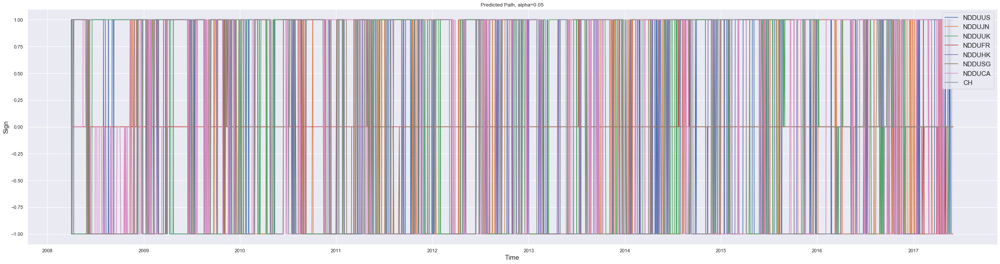

In [64]:
plt.figure(figsize=(40,10))
all_plot = plt.subplot()
all_plot.plot(US["Predicted Path"],label="NDDUUS")
all_plot.plot(JP["Predicted Path"],label="NDDUJN")
all_plot.plot(UK["Predicted Path"],label="NDDUUK")
all_plot.plot(FR["Predicted Path"],label="NDDUFR")
all_plot.plot(HK["Predicted Path"],label="NDDUHK")
all_plot.plot(SG["Predicted Path"],label="NDDUSG")
all_plot.plot(CA["Predicted Path"],label="NDDUCA")
all_plot.plot(CH["Predicted Path"],label="CH")
all_plot.legend(fontsize=15)
all_plot.set_xlabel("Time",fontsize=15)
all_plot.set_ylabel("Sign",fontsize=15)
all_plot.set_title("Predicted Path, alpha=0.05",fontsize=12)

Text(0.5, 1.0, 'Predicted Path, alpha=0.05')

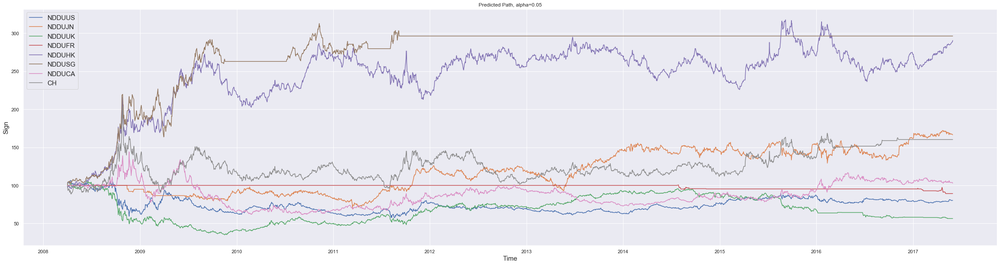

In [65]:
plt.figure(figsize=(40,10))
all_plot = plt.subplot()
all_plot.plot(US["Expected Return Index"],label="NDDUUS")
all_plot.plot(JP["Expected Return Index"],label="NDDUJN")
all_plot.plot(UK["Expected Return Index"],label="NDDUUK")
all_plot.plot(FR["Expected Return Index"],label="NDDUFR")
all_plot.plot(HK["Expected Return Index"],label="NDDUHK")
all_plot.plot(SG["Expected Return Index"],label="NDDUSG")
all_plot.plot(CA["Expected Return Index"],label="NDDUCA")
all_plot.plot(CH["Expected Return Index"],label="CH")
all_plot.legend(fontsize=15)
all_plot.set_xlabel("Time",fontsize=15)
all_plot.set_ylabel("Sign",fontsize=15)
all_plot.set_title("Predicted Path, alpha=0.05",fontsize=12)

In [67]:
df_stats = pd.DataFrame(index=US.index,columns=["US","JPN","UK","FR","HK","SG","CA","CH"])
df_stats["US"]=US["Expected Return Index"]
df_stats["JPN"]=JP["Expected Return Index"]
df_stats["UK"]=UK["Expected Return Index"]
df_stats["FR"]=FR["Expected Return Index"]
df_stats["HK"]=HK["Expected Return Index"]
df_stats["SG"]=SG["Expected Return Index"]
df_stats["CA"]=CA["Expected Return Index"]
df_stats["CH"]=CH["Expected Return Index"]
df_stats["US B&H"]=US["Buy & Hold"]
df_stats["JPN B&H"]=JP["Buy & Hold"]
df_stats["UK B&H"]=UK["Buy & Hold"]
df_stats["FR B&H"]=FR["Buy & Hold"]
df_stats["HK B&H"]=HK["Buy & Hold"]
df_stats["SG B&H"]=SG["Buy & Hold"]
df_stats["CA B&H"]=CA["Buy & Hold"]
df_stats["CH B&H"]=CH["Buy & Hold"]

In [68]:
performance_stats(df_stats)

,US,JPN,UK,FR,HK,SG,CA,CH,US B&H,JPN B&H,UK B&H,FR B&H,HK B&H,SG B&H,CA B&H,CH B&H
Ret%,5.84,7.20,-10.33,-2.91,0.94,0.00,6.63,8.87,10.47,4.52,-3.42,1.27,7.85,0.00,-0.53,-0.75
Std%,11.17,16.14,10.77,2.18,17.08,0.01,13.59,18.41,10.19,12.56,13.52,3.45,16.39,0.01,13.86,17.89
DDBMax%,45.80,31.17,66.73,11.32,25.72,27.84,57.28,55.28,55.86,25.53,63.72,5.86,58.35,63.29,49.32,66.74
TuWMax,0.14,35.32,1.84,12.46,31.42,12.42,3.54,1.89,57.68,25.80,87.16,0.46,30.04,18.08,19.23,94.20
SR,0.52,0.45,-0.96,-1.33,0.06,0.00,0.49,0.48,1.03,0.36,-0.25,0.37,0.48,0.00,-0.04,-0.04
Skew,0.29,0.44,-1.38,-2.71,0.40,0.00,0.30,0.76,-0.08,0.13,-0.38,3.98,-0.48,0.00,0.06,-0.10
Kurt,0.25,-0.56,3.91,6.44,0.46,0.00,-0.33,1.54,0.34,0.79,0.99,23.14,0.69,0.00,-0.30,2.13
hit%,56.52,45.65,39.13,2.17,52.17,0.00,52.17,50.00,67.39,56.52,45.65,10.87,58.70,0.00,50.00,43.48
AvgHit%,2.73,4.99,1.65,0.01,3.87,nan,3.58,4.39,2.45,2.80,2.94,1.88,3.75,nan,3.28,4.13
AvgLos%,-2.33,-2.92,-2.87,-1.40,-3.81,nan,-2.62,-4.77,-2.37,-2.64,-3.40,-1.09,-3.52,nan,-3.20,-4.96


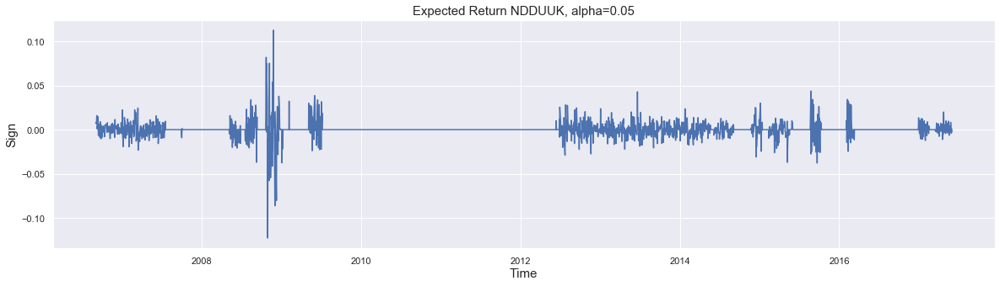

In [75]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUUK, alpha=0.05",fontsize=15)
g_1_2.plot(UK['Expected Return'])

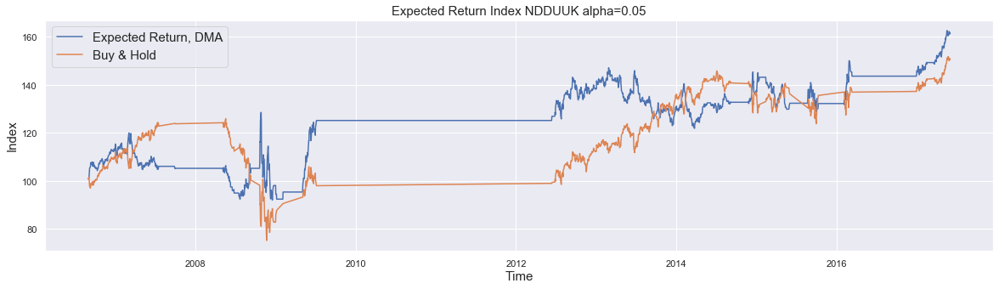

In [76]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUUK alpha=0.05",fontsize=15)
g_1_3.plot(UK["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(UK[UK["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [29]:
accuracy = len(UK[UK["Expected Return"] > 0])/ (len(UK[UK["Expected Return"] < 0])+len(UK[UK["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5205128205128206


Text(0.5, 1.0, 'Predicted Path NDDUUS, alpha=0.05')

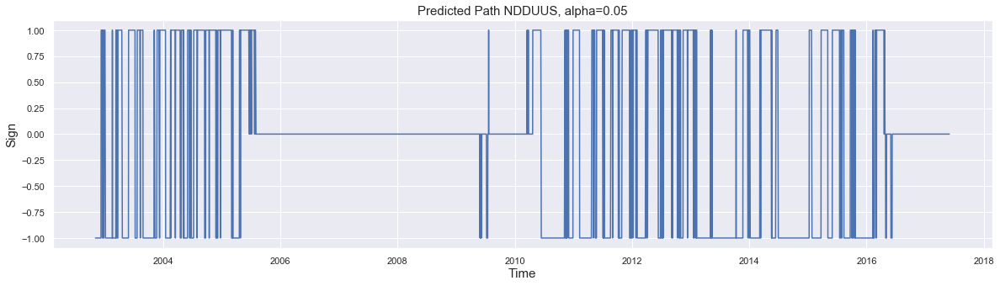

In [30]:
US = Prediction_sign_result_US.copy()
US["Actual Return"] = R_1
US["Expected Return"] = US['Predicted Path']*US['Actual Return']
US["Expected Return Index"]= index(US["Expected Return"])
US["Buy & Hold"] = index(US[US["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(US["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUUS, alpha=0.05",fontsize=15)

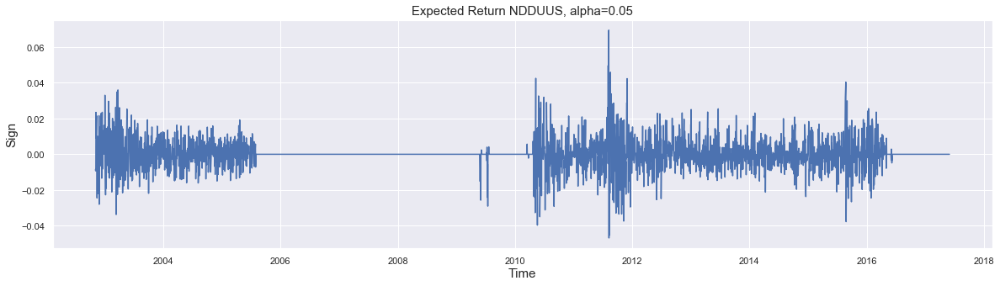

In [32]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUUS, alpha=0.05",fontsize=15)
g_1_2.plot(US['Expected Return'])

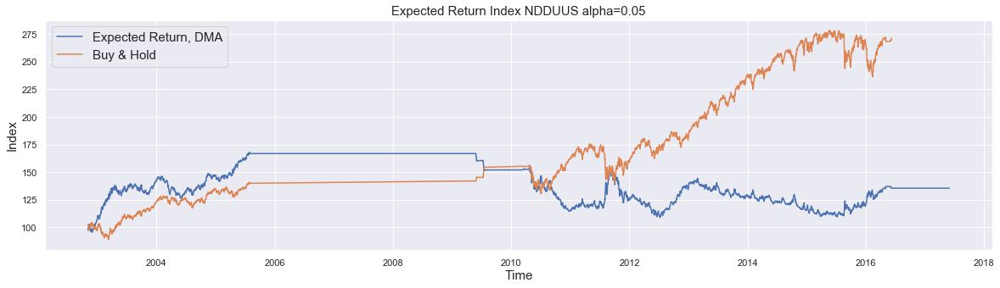

In [31]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUUS alpha=0.05",fontsize=15)
g_1_3.plot(US["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(US[US["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [38]:
accuracy = len(US[US["Expected Return"] > 0])/ (len(US[US["Expected Return"] < 0])+len(US[US["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5024830699774266


Text(0.5, 1.0, 'Predicted Path NDDUJP, alpha=0.05')

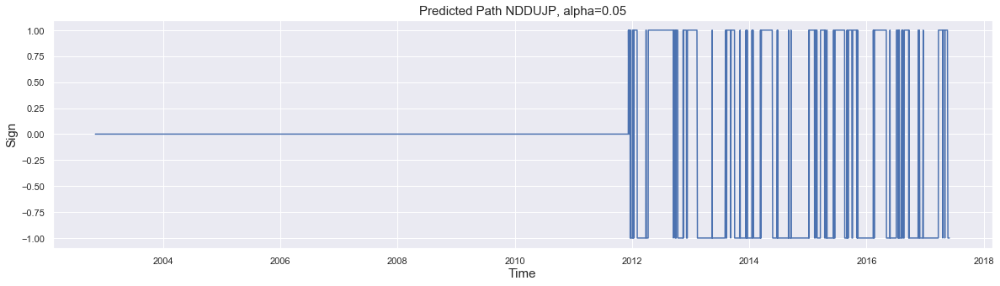

In [34]:
JP = Prediction_sign_result_JP.copy()
JP["Actual Return"] = R_2
JP["Expected Return"] = JP['Predicted Path']*JP['Actual Return']
JP["Expected Return Index"]= index(JP["Expected Return"])
JP["Buy & Hold"] = index(JP[JP["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(JP["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUJP, alpha=0.05",fontsize=15)

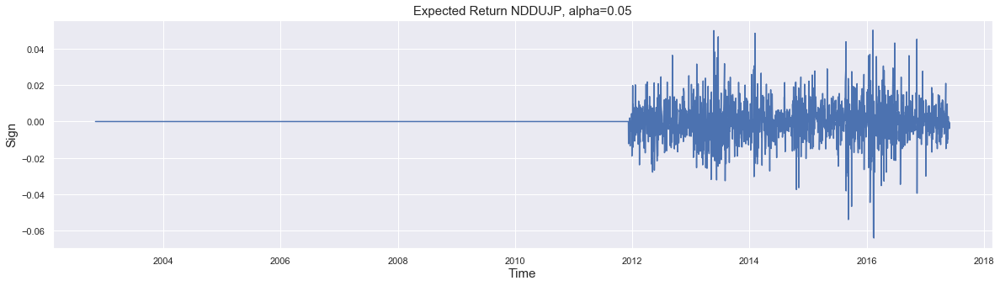

In [35]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUJP, alpha=0.05",fontsize=15)
g_1_2.plot(JP['Expected Return'])

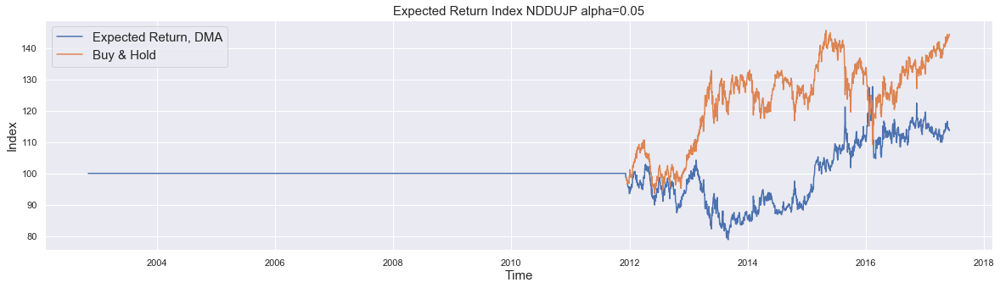

In [36]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUJP alpha=0.05",fontsize=15)
g_1_3.plot(JP["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(JP[JP["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [39]:
accuracy = len(JP[JP["Expected Return"] > 0])/ (len(JP[JP["Expected Return"] < 0])+len(JP[JP["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5116279069767442


Text(0.5, 1.0, 'Predicted Path NDDUFR, alpha=0.05')

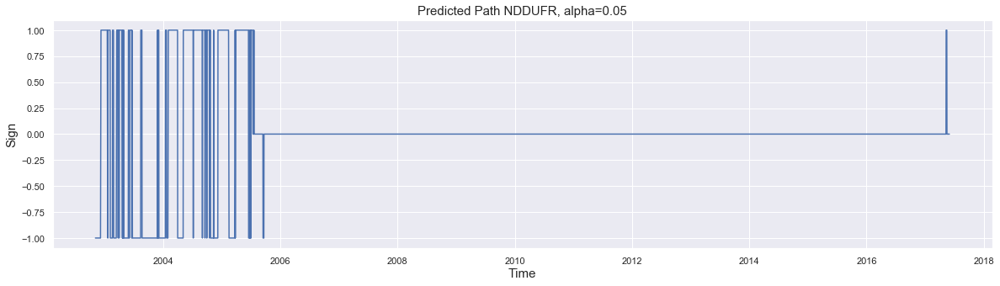

In [40]:
FR = Prediction_sign_result_FR.copy()
FR["Actual Return"] = R_4
FR["Expected Return"] = FR['Predicted Path']*FR['Actual Return']
FR["Expected Return Index"]= index(FR["Expected Return"])
FR["Buy & Hold"] = index(FR[FR["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(FR["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUFR, alpha=0.05",fontsize=15)

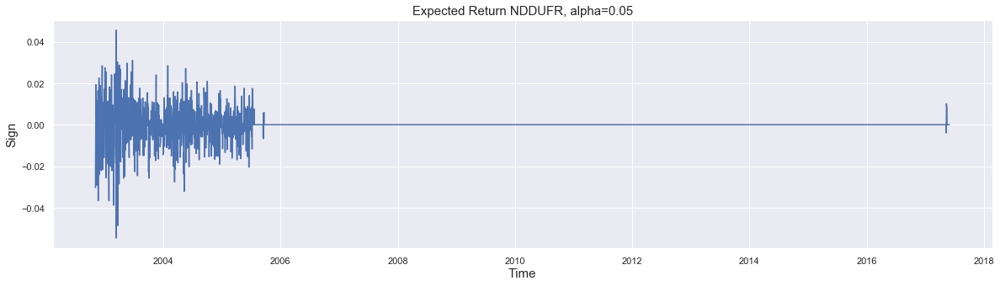

In [41]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUFR, alpha=0.05",fontsize=15)
g_1_2.plot(FR['Expected Return'])

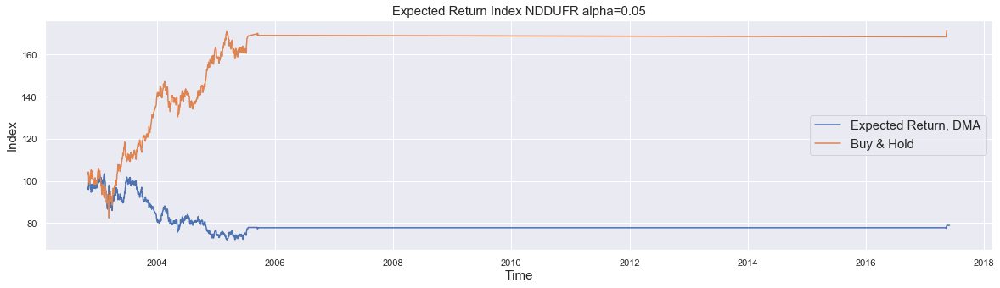

In [42]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUFR alpha=0.05",fontsize=15)
g_1_3.plot(FR["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(FR[FR["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [43]:
accuracy = len(FR[FR["Expected Return"] > 0])/ (len(FR[FR["Expected Return"] < 0])+len(FR[FR["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.4864864864864865


Text(0.5, 1.0, 'Predicted Path NDDUHK, alpha=0.05')

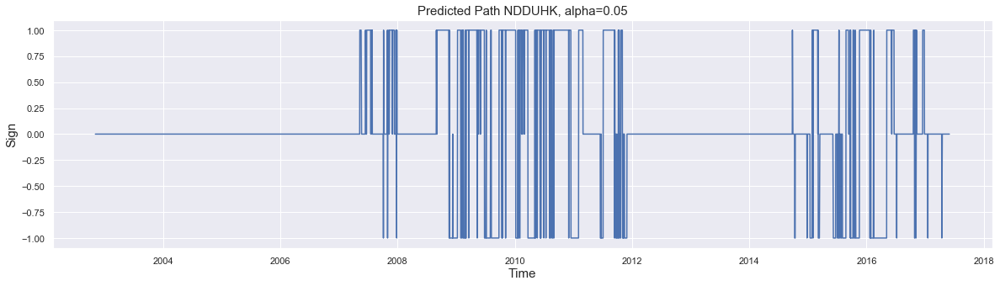

In [44]:
HK = Prediction_sign_result_HK.copy()
HK["Actual Return"] = R_5
HK["Expected Return"] = HK['Predicted Path']*HK['Actual Return']
HK["Expected Return Index"]= index(HK["Expected Return"])
HK["Buy & Hold"] = index(HK[HK["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(HK["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUHK, alpha=0.05",fontsize=15)

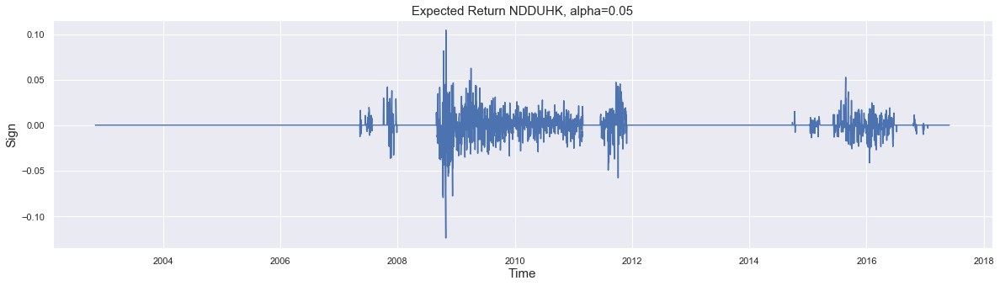

In [45]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUHK, alpha=0.05",fontsize=15)
g_1_2.plot(HK['Expected Return'])

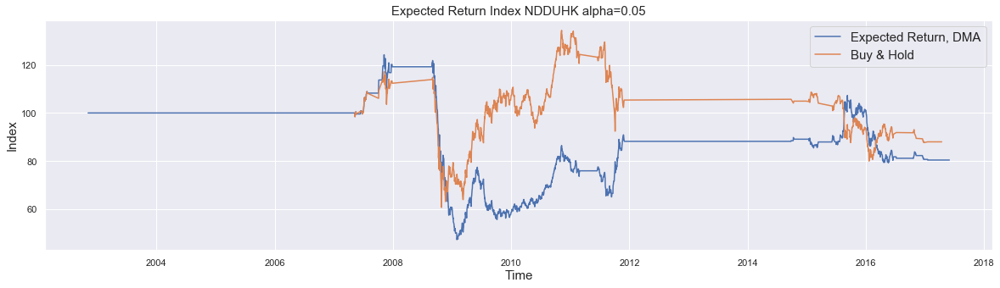

In [46]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUHK alpha=0.05",fontsize=15)
g_1_3.plot(HK["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(HK[HK["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [47]:
accuracy = len(HK[HK["Expected Return"] > 0])/ (len(HK[HK["Expected Return"] < 0])+len(HK[HK["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5077202543142597


Text(0.5, 1.0, 'Predicted Path NDDUSG, alpha=0.05')

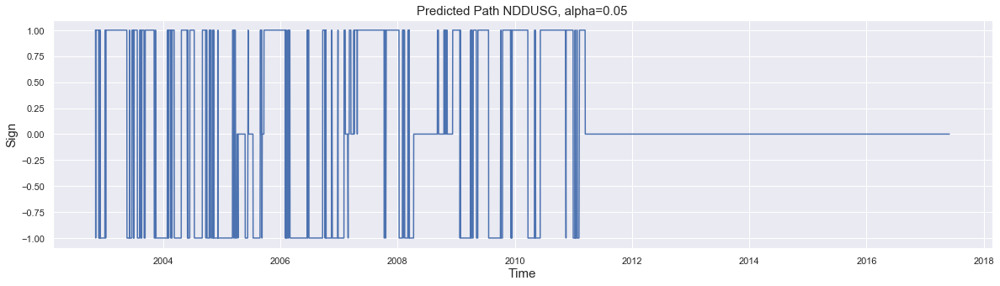

In [48]:
SG = Prediction_sign_result_SG.copy()
SG["Actual Return"] = R_6
SG["Expected Return"] = SG['Predicted Path']*SG['Actual Return']
SG["Expected Return Index"]= index(SG["Expected Return"])
SG["Buy & Hold"] = index(SG[SG["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(SG["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUSG, alpha=0.05",fontsize=15)

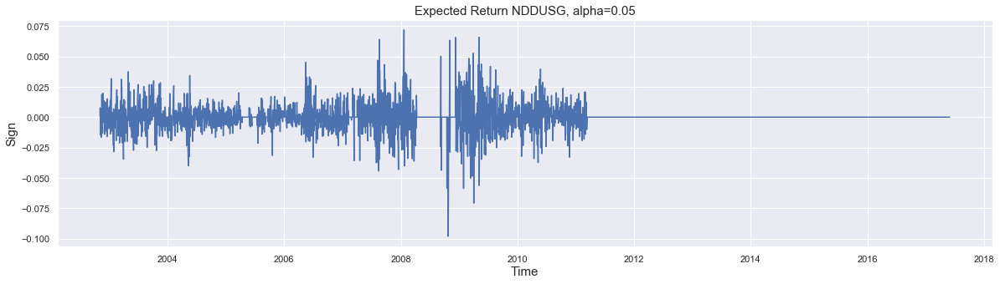

In [49]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUSG, alpha=0.05",fontsize=15)
g_1_2.plot(SG['Expected Return'])

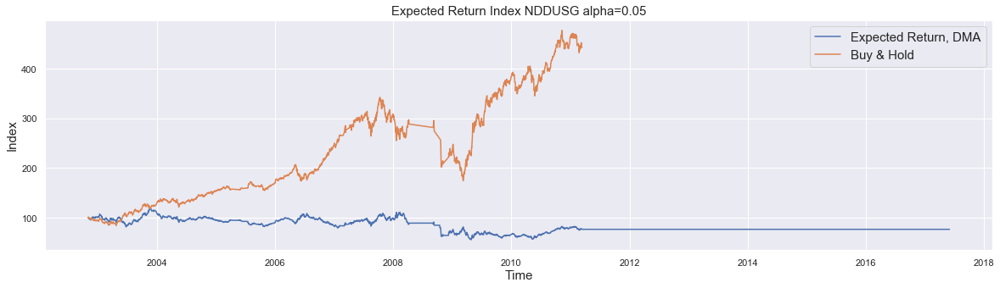

In [50]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUSG alpha=0.05",fontsize=15)
g_1_3.plot(SG["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(SG[SG["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [52]:
accuracy = len(SG[SG["Expected Return"] > 0])/ (len(SG[SG["Expected Return"] < 0])+len(SG[SG["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.5013164823591364


Text(0.5, 1.0, 'Predicted Path, alpha=0.05')

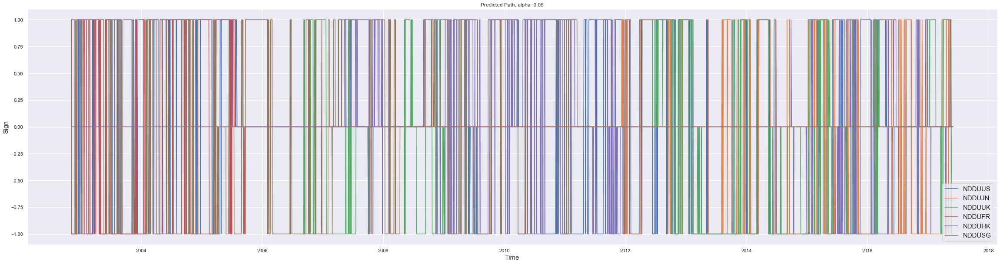

In [53]:
plt.figure(figsize=(40,10))
all_plot = plt.subplot()
all_plot.plot(US["Predicted Path"],label="NDDUUS")
all_plot.plot(JP["Predicted Path"],label="NDDUJN")
all_plot.plot(UK["Predicted Path"],label="NDDUUK")
all_plot.plot(FR["Predicted Path"],label="NDDUFR")
all_plot.plot(HK["Predicted Path"],label="NDDUHK")
all_plot.plot(SG["Predicted Path"],label="NDDUSG")
all_plot.legend(fontsize=15)
all_plot.set_xlabel("Time",fontsize=15)
all_plot.set_ylabel("Sign",fontsize=15)
all_plot.set_title("Predicted Path, alpha=0.05",fontsize=12)

In [54]:
df_stats = pd.DataFrame(index=US.index,columns=["NDDUUS","NDDUJN","NDDUUK","NDDUFR","NDDUHK","NDDUSG"])
df_stats["NDDUUS"]=US["Expected Return Index"]
df_stats["NDDUJN"]=JP["Expected Return Index"]
df_stats["NDDUUK"]=UK["Expected Return Index"]
df_stats["NDDUFR"]=FR["Expected Return Index"]
df_stats["NDDUHK"]=HK["Expected Return Index"]
df_stats["NDDUSG"]=SG["Expected Return Index"]
df_stats["NDDUUS B&H"]=US["Buy & Hold"]
df_stats["NDDUJN B&H"]=JP["Buy & Hold"]
df_stats["NDDUUK B&H"]=UK["Buy & Hold"]
df_stats["NDDUFR B&H"]=FR["Buy & Hold"]
df_stats["NDDUHK B&H"]=HK["Buy & Hold"]
df_stats["NDDUSG B&H"]=SG["Buy & Hold"]

In [56]:
df_stats

,NDDUUS,NDDUJN,NDDUUK,NDDUFR,NDDUHK,NDDUSG,NDDUUS B&H,NDDUJN B&H,NDDUUK B&H,NDDUFR B&H,NDDUHK B&H,NDDUSG B&H
2002-11-04,99.1022,100,NaN,96.9641,100,100.093,100.897798,NaN,NaN,103.035873,NaN,100.093448
2002-11-05,98.271,100,NaN,95.9103,100,100.863,101.744083,NaN,NaN,104.155698,NaN,100.862714
2002-11-06,97.3573,100,NaN,97.2616,100,100.379,102.690045,NaN,NaN,102.688229,NaN,101.346664
2002-11-07,99.643,100,NaN,99.1368,100,98.8906,100.279154,NaN,NaN,100.708428,NaN,99.844188
2002-11-08,100.554,100,NaN,100.236,100,99.1178,99.362629,NaN,NaN,99.591760,NaN,100.073571
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-05-25,135.425,114.146,160.932,78.9067,80.3711,76.6954,NaN,143.697383,151.350215,NaN,NaN,NaN
2017-05-26,135.425,114.111,162.268,78.9067,80.3711,76.6954,NaN,143.741809,150.093546,NaN,NaN,NaN
2017-05-29,135.425,114.097,161.616,78.9067,80.3711,76.6954,NaN,143.758675,150.696685,NaN,NaN,NaN
2017-05-30,135.425,113.659,161.807,78.9067,80.3711,76.6954,NaN,144.311099,150.518935,NaN,NaN,NaN


In [55]:
performance_stats(df_stats)

,NDDUUS,NDDUJN,NDDUUK,NDDUFR,NDDUHK,NDDUSG,NDDUUS B&H,NDDUJN B&H,NDDUUK B&H,NDDUFR B&H,NDDUHK B&H,NDDUSG B&H
Ret%,1.57,3.64,4.80,0.26,-1.69,0.00,10.33,7.22,8.30,0.26,-3.28,0.00
Std%,9.32,15.50,10.88,0.60,10.54,0.01,9.89,13.24,9.41,0.60,9.16,0.01
DDBMax%,35.15,24.35,28.44,30.52,62.04,53.50,20.39,25.05,40.32,22.23,48.28,49.07
DDBMed%,9.90,0.00,4.31,25.06,29.05,36.15,2.16,5.87,4.18,3.56,18.08,3.42
TuWMax,147.05,25.33,45.52,178.86,118.76,167.95,11.29,25.95,7.10,8.52,8.81,8.05
TuWMed,56.52,0.00,6.48,88.33,28.24,77.43,0.05,0.00,0.00,0.00,0.00,0.00
SR,0.17,0.23,0.44,0.43,-0.16,0.00,1.04,0.55,0.88,0.43,-0.36,0.00
Skew,0.02,-0.51,0.57,8.06,-0.10,0.00,-0.15,-0.16,0.25,8.06,-0.72,0.00
Kurt,0.23,0.29,3.30,65.00,18.03,0.00,0.52,0.39,0.50,65.00,11.16,0.00
Corr,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


/Users/seungjuseo/.pyenv/versions/3.7.1/envs/myenv/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Predicted Path NDDUUS, alpha=0.05')

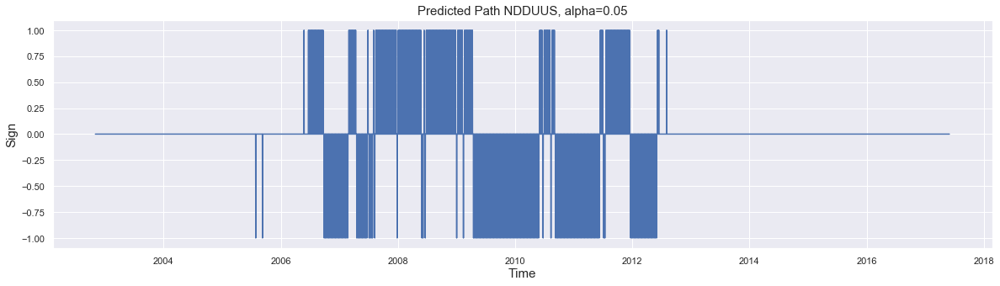

In [17]:
k_1 = Prediction_sign_1.copy()
k_1["Actual Return"] = R_1
k_1["Expected Return"] = k_1['Predicted Path']*k_1['Actual Return']
k_1["Expected Return Index"]= index(k_1["Expected Return"])
k_1["Buy & Hold"] = index(k_1[k_1["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_1 = plt.subplot()
g_1.plot(k_1["Predicted Path"])
g_1.set_xlabel("Time",fontsize=15)
g_1.set_ylabel("Sign",fontsize=15)
g_1.set_title("Predicted Path NDDUUS, alpha=0.05",fontsize=15)

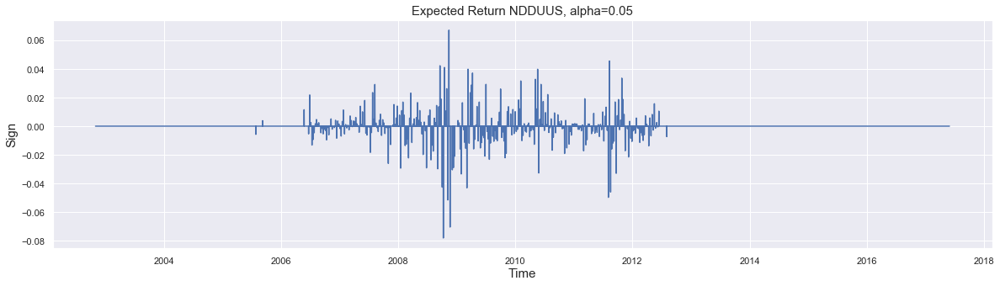

In [18]:
plt.figure(figsize=(20,5))
g_1_2 = plt.subplot()
g_1_2.set_xlabel("Time",fontsize=15)
g_1_2.set_ylabel("Sign",fontsize=15)
g_1_2.set_title("Expected Return NDDUUS, alpha=0.05",fontsize=15)
g_1_2.plot(k_1['Expected Return'])

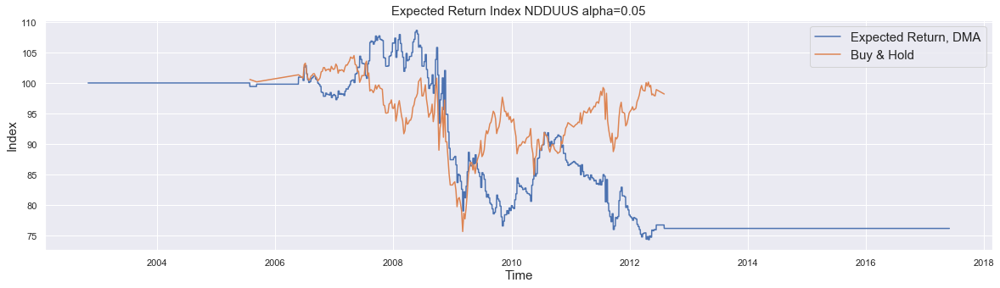

In [19]:
fig = plt.figure(figsize=(20,5))
g_1_3 = fig.add_subplot()
g_1_3.set_xlabel("Time",fontsize=15)
g_1_3.set_ylabel("Index",fontsize=15)
g_1_3.set_title("Expected Return Index NDDUUS alpha=0.05",fontsize=15)
g_1_3.plot(k_1["Expected Return Index"], label='Expected Return, DMA')
g_1_3.plot(index(k_1[k_1["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_1_3.legend(fontsize=15)

In [20]:
accuracy = len(k_1[k_1["Expected Return"] > 0])/ (len(k_1[k_1["Expected Return"] < 0])+len(k_1[k_1["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.47249190938511326


Text(0.5, 1.0, 'Predicted Path NDDUJN, alpha=0.05')

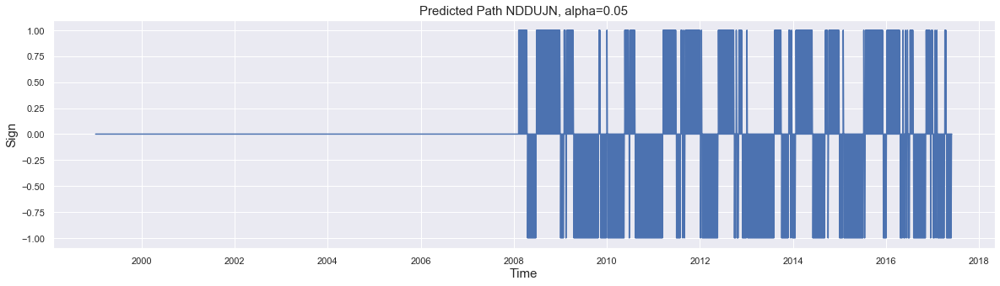

In [21]:
k_2 = Prediction_sign_2.copy()
k_2["Actual Return"] = R_2
k_2["Expected Return"] = k_2['Predicted Path']*k_2['Actual Return']
k_2["Expected Return Index"]= index(k_2["Expected Return"])
k_2["Buy & Hold"] = index(k_2[k_2["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_2 = plt.subplot()
g_2.plot(k_2["Predicted Path"])
g_2.set_xlabel("Time",fontsize=15)
g_2.set_ylabel("Sign",fontsize=15)
g_2.set_title("Predicted Path NDDUJN, alpha=0.05",fontsize=15)

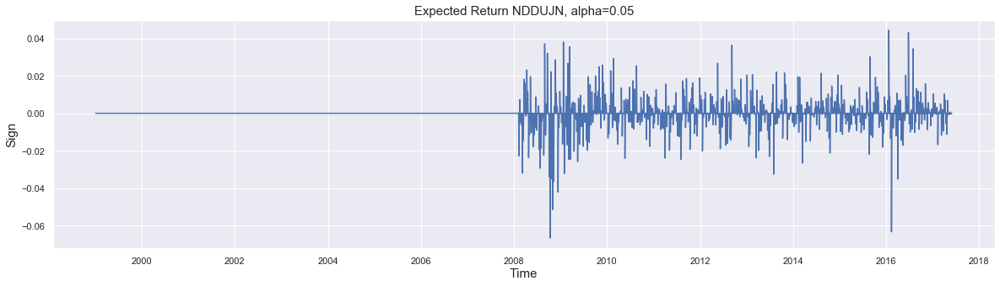

In [22]:
plt.figure(figsize=(20,5))
g_2_2 = plt.subplot()
g_2_2.set_xlabel("Time",fontsize=15)
g_2_2.set_ylabel("Sign",fontsize=15)
g_2_2.set_title("Expected Return NDDUJN, alpha=0.05",fontsize=15)
g_2_2.plot(k_2['Expected Return'])

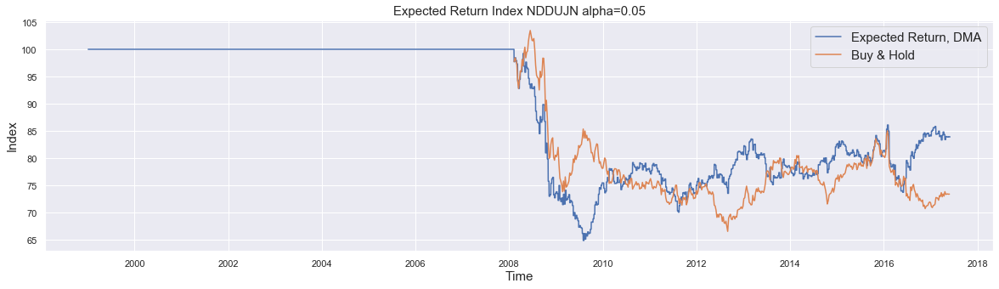

In [23]:
fig = plt.figure(figsize=(20,5))
g_2_3 = fig.add_subplot()
g_2_3.set_xlabel("Time",fontsize=15)
g_2_3.set_ylabel("Index",fontsize=15)
g_2_3.set_title("Expected Return Index NDDUJN alpha=0.05",fontsize=15)
g_2_3.plot(k_2["Expected Return Index"], label='Expected Return, DMA')
g_2_3.plot(index(k_2[k_2["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_2_3.legend(fontsize=15)

In [24]:
accuracy = len(k_2[k_2["Expected Return"] > 0])/ (len(k_2[k_2["Expected Return"] < 0])+len(k_2[k_2["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.512396694214876


Text(0.5, 1.0, 'Predicted Path NDDUUK, alpha=0.05')

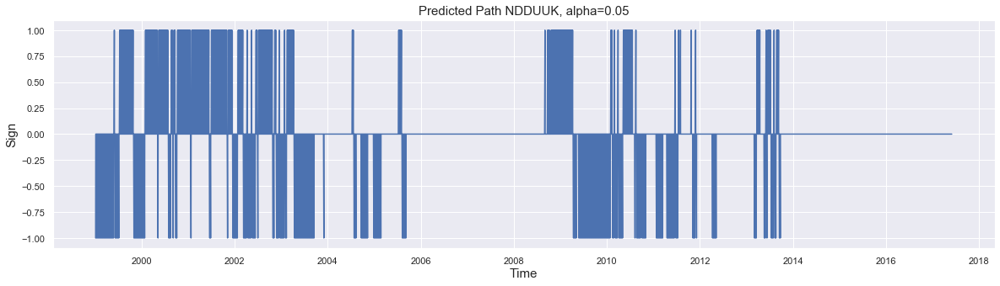

In [25]:
k_3 = Prediction_sign_3.copy()
k_3["Actual Return"] = R_3
k_3["Expected Return"] = k_3['Predicted Path']*k_3['Actual Return']
k_3["Expected Return Index"]= index(k_3["Expected Return"])
k_3["Buy & Hold"] = index(k_3[k_3["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_3 = plt.subplot()
g_3.plot(k_3["Predicted Path"])
g_3.set_xlabel("Time",fontsize=15)
g_3.set_ylabel("Sign",fontsize=15)
g_3.set_title("Predicted Path NDDUUK, alpha=0.05",fontsize=15)

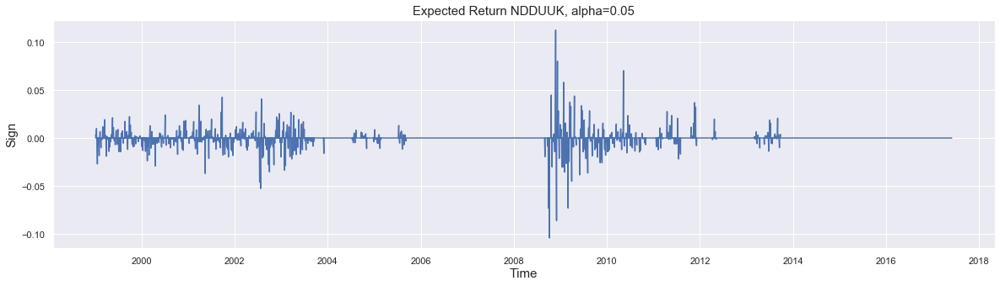

In [27]:
plt.figure(figsize=(20,5))
g_3_2 = plt.subplot()
g_3_2.set_xlabel("Time",fontsize=15)
g_3_2.set_ylabel("Sign",fontsize=15)
g_3_2.set_title("Expected Return NDDUUK, alpha=0.05",fontsize=15)
g_3_2.plot(k_3['Expected Return'])

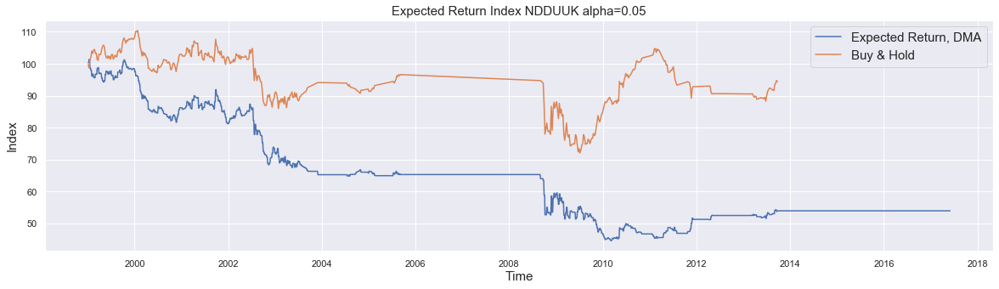

In [28]:
fig = plt.figure(figsize=(20,5))
g_3_3 = fig.add_subplot()
g_3_3.set_xlabel("Time",fontsize=15)
g_3_3.set_ylabel("Index",fontsize=15)
g_3_3.set_title("Expected Return Index NDDUUK alpha=0.05",fontsize=15)
g_3_3.plot(k_3["Expected Return Index"], label='Expected Return, DMA')
g_3_3.plot(index(k_3[k_3["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_3_3.legend(fontsize=15)

In [29]:
accuracy = len(k_3[k_3["Expected Return"] > 0])/ (len(k_3[k_3["Expected Return"] < 0])+len(k_3[k_3["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.4321266968325792


Text(0.5, 1.0, 'Predicted Path NDDUFR, alpha=0.05')

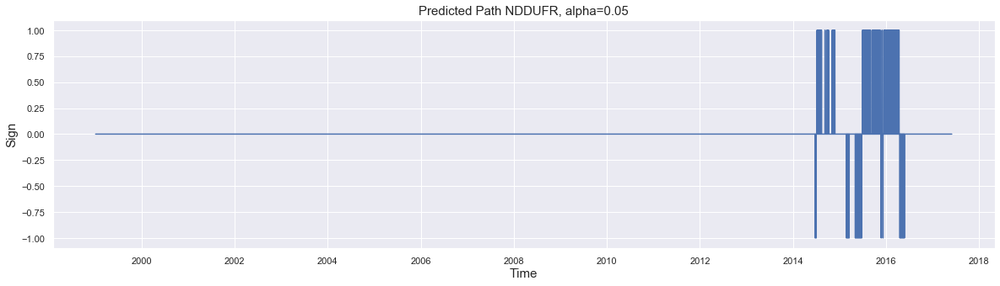

In [30]:
k_4 = Prediction_sign_4.copy()
k_4["Actual Return"] = R_4
k_4["Expected Return"] = k_4['Predicted Path']*k_4['Actual Return']
k_4["Expected Return Index"]= index(k_4["Expected Return"])
k_4["Buy & Hold"] = index(k_4[k_4["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_4 = plt.subplot()
g_4.plot(k_4["Predicted Path"])
g_4.set_xlabel("Time",fontsize=15)
g_4.set_ylabel("Sign",fontsize=15)
g_4.set_title("Predicted Path NDDUFR, alpha=0.05",fontsize=15)

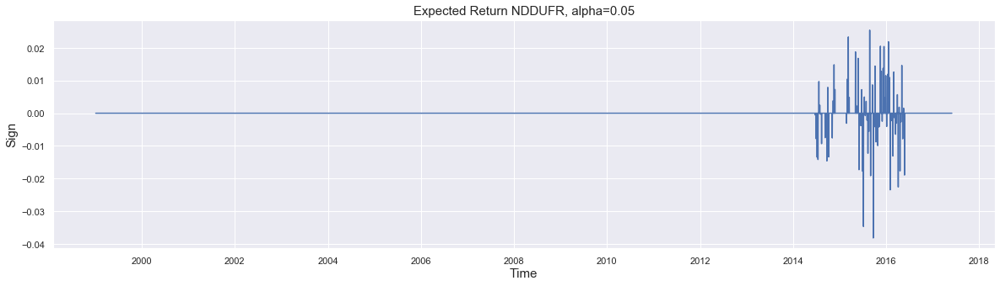

In [31]:
plt.figure(figsize=(20,5))
g_4_2 = plt.subplot()
g_4_2.set_xlabel("Time",fontsize=15)
g_4_2.set_ylabel("Sign",fontsize=15)
g_4_2.set_title("Expected Return NDDUFR, alpha=0.05",fontsize=15)
g_4_2.plot(k_4['Expected Return'])

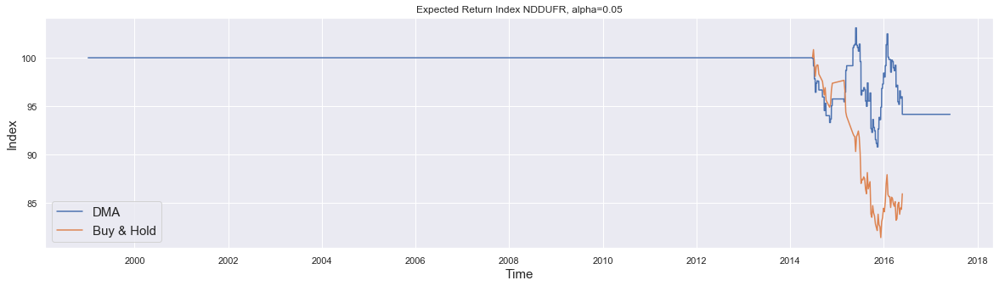

In [32]:
plt.figure(figsize=(20,5))
g_4_3 = plt.subplot()
g_4_3.set_xlabel("Time",fontsize=15)
g_4_3.set_ylabel("Index",fontsize=15)
g_4_3.set_title("Expected Return Index NDDUFR, alpha=0.05")
g_4_3.plot(k_4['Expected Return Index'],label='DMA')
g_4_3.plot(index(k_4[k_4["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_4_3.legend(fontsize=15)

In [33]:
accuracy = len(k_4[k_4["Expected Return"] > 0])/ (len(k_4[k_4["Expected Return"] < 0])+len(k_4[k_4["Expected Return"] > 0]))
print("Accuracy of prediction is :",accuracy)

Accuracy of prediction is : 0.44


Text(0.5, 1.0, 'Predicted Path NDDUHK, alpha=0.05')

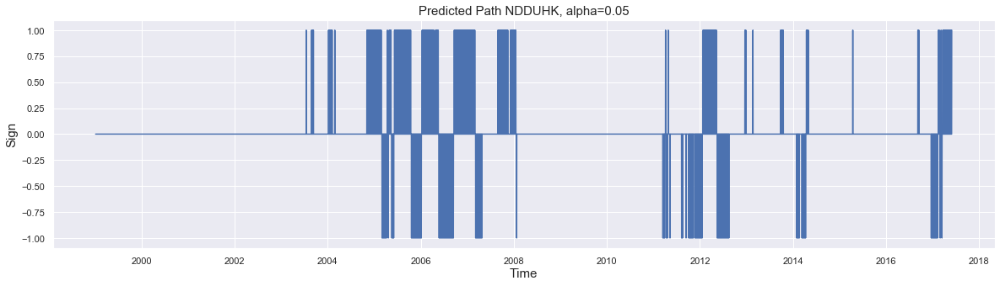

In [34]:
k_5 = Prediction_sign_5.copy()
k_5["Actual Return"] = R_5
k_5["Expected Return"] = k_5['Predicted Path']*k_5['Actual Return']
k_5["Expected Return Index"]= index(k_5["Expected Return"])
k_5["Buy & Hold"] = index(k_5[k_5["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_5 = plt.subplot()
g_5.plot(k_5["Predicted Path"])
g_5.set_xlabel("Time",fontsize=15)
g_5.set_ylabel("Sign",fontsize=15)
g_5.set_title("Predicted Path NDDUHK, alpha=0.05",fontsize=15)

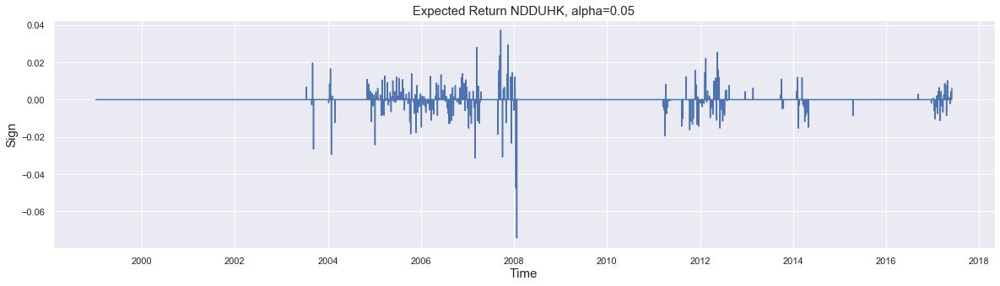

In [35]:
plt.figure(figsize=(20,5))
g_5_2 = plt.subplot()
g_5_2.set_xlabel("Time",fontsize=15)
g_5_2.set_ylabel("Sign",fontsize=15)
g_5_2.set_title("Expected Return NDDUHK, alpha=0.05",fontsize=15)
g_5_2.plot(k_5['Expected Return'])

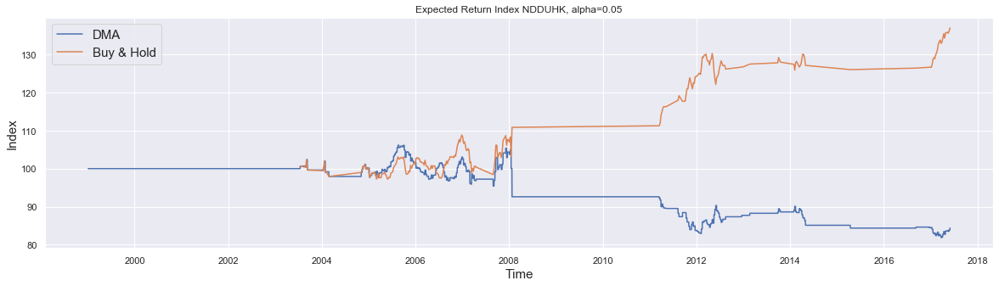

In [36]:
plt.figure(figsize=(20,5))
g_5_3 = plt.subplot()
g_5_3.set_xlabel("Time",fontsize=15)
g_5_3.set_ylabel("Index",fontsize=15)
g_5_3.set_title("Expected Return Index NDDUHK, alpha=0.05")
g_5_3.plot(k_5['Expected Return Index'],label='DMA')
g_5_3.plot(index(k_5[k_5["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_5_3.legend(fontsize=15)

Text(0.5, 1.0, 'Predicted Path NDDUSG, alpha=0.05')

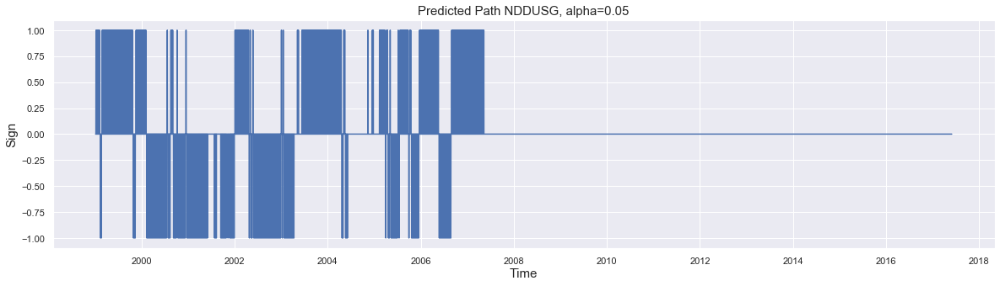

In [41]:
k_6 = Prediction_sign_6.copy()
k_6["Actual Return"] = R_6
k_6["Expected Return"] = k_6['Predicted Path']*k_6['Actual Return']
k_6["Expected Return Index"]= index(k_6["Expected Return"])
k_6["Buy & Hold"] = index(k_6[k_6["Predicted Path"] != 0]["Actual Return"])
plt.figure(figsize=(20,5))
g_6 = plt.subplot()
g_6.plot(k_6["Predicted Path"])
g_6.set_xlabel("Time",fontsize=15)
g_6.set_ylabel("Sign",fontsize=15)
g_6.set_title("Predicted Path NDDUSG, alpha=0.05",fontsize=15)

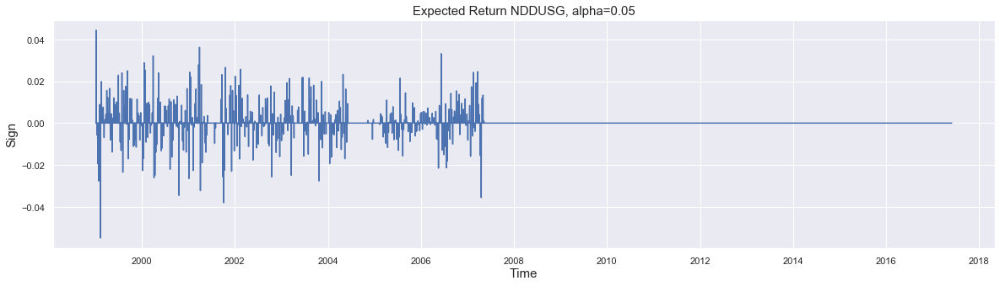

In [42]:
plt.figure(figsize=(20,5))
g_6_2 = plt.subplot()
g_6_2.set_xlabel("Time",fontsize=15)
g_6_2.set_ylabel("Sign",fontsize=15)
g_6_2.set_title("Expected Return NDDUSG, alpha=0.05",fontsize=15)
g_6_2.plot(k_6['Expected Return'])

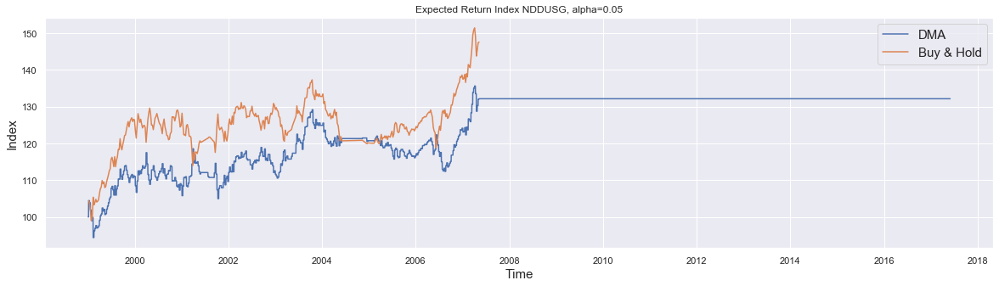

In [43]:
plt.figure(figsize=(20,5))
g_6_3 = plt.subplot()
g_6_3.set_xlabel("Time",fontsize=15)
g_6_3.set_ylabel("Index",fontsize=15)
g_6_3.set_title("Expected Return Index NDDUSG, alpha=0.05")
g_6_3.plot(k_6['Expected Return Index'],label='DMA')
g_6_3.plot(index(k_6[k_6["Predicted Path"] != 0]["Actual Return"]),label='Buy & Hold')
g_6_3.legend(fontsize=15)

Text(0.5, 1.0, 'Predicted Path, alpha=0.05')

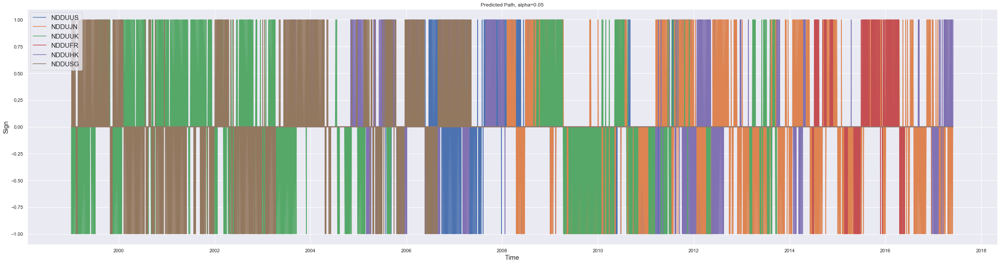

In [49]:
plt.figure(figsize=(40,10))
all_plot = plt.subplot()
all_plot.plot(k_1["Predicted Path"],label="NDDUUS")
all_plot.plot(k_2["Predicted Path"],label="NDDUJN")
all_plot.plot(k_3["Predicted Path"],label="NDDUUK")
all_plot.plot(k_4["Predicted Path"],label="NDDUFR")
all_plot.plot(k_5["Predicted Path"],label="NDDUHK")
all_plot.plot(k_6["Predicted Path"],label="NDDUSG")
all_plot.legend(fontsize=15)
all_plot.set_xlabel("Time",fontsize=15)
all_plot.set_ylabel("Sign",fontsize=15)
all_plot.set_title("Predicted Path, alpha=0.05",fontsize=12)

In [50]:
k_1

,Predicted Path,Actual Return,Expected Return,Expected Return Index,Buy & Hold
2002-11-01,0,0.017317,0,100,NaN
2002-11-04,0,0.008978,0,100,NaN
2002-11-05,0,0.008388,0,100,NaN
2002-11-06,0,0.009297,0,100,NaN
2002-11-07,0,-0.023477,-0,100,NaN
...,...,...,...,...,...
2017-05-25,0,0.004489,0,76.1669,NaN
2017-05-26,0,0.000392,0,76.1669,NaN
2017-05-29,0,0.000000,0,76.1669,NaN
2017-05-30,0,-0.001039,-0,76.1669,NaN


In [75]:
df_stats = pd.DataFrame(index=k_1.index,columns=["NDDUUS","NDDUJN","NDDUUK","NDDUFR","NDDUHK","NDDUSG"])

In [76]:
df_stats["NDDUUS"]=k_1["Expected Return Index"]
df_stats["NDDUJN"]=k_2["Expected Return Index"]
df_stats["NDDUUK"]=k_3["Expected Return Index"]
df_stats["NDDUFR"]=k_4["Expected Return Index"]
df_stats["NDDUHK"]=k_5["Expected Return Index"]
df_stats["NDDUSG"]=k_6["Expected Return Index"]
df_stats["NDDUUS B&H"]=k_1["Buy & Hold"]
df_stats["NDDUJN B&H"]=k_2["Buy & Hold"]
df_stats["NDDUUK B&H"]=k_3["Buy & Hold"]
df_stats["NDDUFR B&H"]=k_4["Buy & Hold"]
df_stats["NDDUHK B&H"]=k_5["Buy & Hold"]
df_stats["NDDUSG B&H"]=k_6["Buy & Hold"]

In [77]:
df_stats

,NDDUUS,NDDUJN,NDDUUK,NDDUFR,NDDUHK,NDDUSG,NDDUUS B&H,NDDUJN B&H,NDDUUK B&H,NDDUFR B&H,NDDUHK B&H,NDDUSG B&H
2002-11-01,100,100,70.7122,100,100,115.308,NaN,NaN,NaN,NaN,NaN,NaN
2002-11-04,100,100,68.7308,100,100,115.308,NaN,NaN,90.119438,NaN,NaN,NaN
2002-11-05,100,100,68.7308,100,100,115.308,NaN,NaN,NaN,NaN,NaN,NaN
2002-11-06,100,100,68.7308,100,100,115.308,NaN,NaN,NaN,NaN,NaN,NaN
2002-11-07,100,100,68.7308,100,100,117.018,NaN,NaN,NaN,NaN,NaN,125.382105
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-05-25,76.1669,83.9506,53.9322,94.1541,83.901,132.121,NaN,NaN,NaN,NaN,NaN,NaN
2017-05-26,76.1669,83.9247,53.9322,94.1541,83.901,132.121,NaN,73.413435,NaN,NaN,NaN,NaN
2017-05-29,76.1669,83.9247,53.9322,94.1541,83.901,132.121,NaN,NaN,NaN,NaN,NaN,NaN
2017-05-30,76.1669,83.9247,53.9322,94.1541,83.901,132.121,NaN,NaN,NaN,NaN,NaN,NaN


In [78]:
performance_stats(df_stats)

,NDDUUS,NDDUJN,NDDUUK,NDDUFR,NDDUHK,NDDUSG,NDDUUS B&H,NDDUJN B&H,NDDUUK B&H,NDDUFR B&H,NDDUHK B&H,NDDUSG B&H
Ret%,0.00,2.84,0.00,-2.03,-0.29,0.00,0.00,-1.81,0.00,-5.08,2.59,0.00
Std%,0.01,9.83,0.01,7.66,1.96,0.01,0.01,8.79,0.01,6.02,2.05,0.01
DDBMax%,31.58,35.11,39.56,11.94,22.84,12.98,27.60,35.66,25.44,19.26,9.56,13.47
DDBMed%,21.70,18.45,26.97,0.00,12.74,2.55,8.96,26.58,7.08,13.76,1.90,6.59
TuWMax,111.86,115.62,179.38,24.81,146.19,125.90,0.05,0.05,0.05,0.05,0.05,0.05
TuWMed,21.31,25.07,88.83,0.00,55.64,38.76,0.00,0.00,0.00,0.00,0.00,0.00
SR,0.00,0.29,0.00,-0.26,-0.15,0.00,0.00,-0.21,0.00,-0.84,1.26,0.00
Skew,0.00,-0.11,0.00,0.16,-0.51,0.00,0.00,-0.61,0.00,-0.69,1.91,0.00
Kurt,0.00,3.45,0.00,0.69,6.48,0.00,0.00,3.86,0.00,2.10,3.27,0.00
Corr,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [70]:
df_stats_2 = pd.DataFrame(index=df_stats.index,columns=["NDDUUS","NDDUJN","NDDUUK","NDDUFR","NDDUHK","NDDUSG"])

In [79]:
df_stats_2["NDDUUS"]=k_1["Expected Return"]
df_stats_2["NDDUJN"]=k_2["Expected Return"]
df_stats_2["NDDUUK"]=k_3["Expected Return"]
df_stats_2["NDDUFR"]=k_4["Expected Return"]
df_stats_2["NDDUHK"]=k_5["Expected Return"]
df_stats_2["NDDUSG"]=k_6["Expected Return"]

In [80]:
df_stats_2

,NDDUUS,NDDUJN,NDDUUK,NDDUFR,NDDUHK,NDDUSG
2002-11-01,0,0,-0,-0,-0,-0
2002-11-04,0,-0,-0.0280209,0,0,0
2002-11-05,0,0,0,0,-0,0
2002-11-06,0,-0,-0,-0,0,0
2002-11-07,-0,0,0,-0,0,0.0148251
...,...,...,...,...,...,...
2017-05-25,0,0,-0,0,0,0
2017-05-26,0,-0.000309165,-0,-0,0,-0
2017-05-29,0,0,0,-0,0,-0
2017-05-30,-0,0,-0,-0,0,-0


In [92]:
df_stats_3 = pd.DataFrame(index=["Total Return / Total Trading Days","Days of Positive Return","Accuracy"],columns=["NDDUUS","NDDUJN","NDDUUK","NDDUFR","NDDUHK","NDDUSG"])

In [112]:
df_stats_3['NDDUUS']['Total Return / Total Trading Days'] = df_stats_2[df_stats_2["NDDUUS"] != 0]["NDDUUS"].sum()/len(df_stats_2[df_stats_2["NDDUUS"] != 0]) # Total Return / Total Trading Days
df_stats_3['NDDUJN']['Total Return / Total Trading Days'] = df_stats_2[df_stats_2["NDDUJN"] != 0]["NDDUJN"].sum()/len(df_stats_2[df_stats_2["NDDUJN"] != 0])
df_stats_3['NDDUUK']['Total Return / Total Trading Days'] = df_stats_2[df_stats_2["NDDUUK"] != 0]["NDDUUK"].sum()/len(df_stats_2[df_stats_2["NDDUUK"] != 0])
df_stats_3['NDDUFR']['Total Return / Total Trading Days'] = df_stats_2[df_stats_2["NDDUFR"] != 0]["NDDUFR"].sum()/len(df_stats_2[df_stats_2["NDDUFR"] != 0])
df_stats_3['NDDUHK']['Total Return / Total Trading Days'] = df_stats_2[df_stats_2["NDDUHK"] != 0]["NDDUHK"].sum()/len(df_stats_2[df_stats_2["NDDUHK"] != 0])
df_stats_3['NDDUSG']['Total Return / Total Trading Days'] = df_stats_2[df_stats_2["NDDUSG"] != 0]["NDDUSG"].sum()/len(df_stats_2[df_stats_2["NDDUSG"] != 0])
df_stats_3['NDDUUS']['Days of Positive Return'] = len(df_stats_2[df_stats_2["NDDUUS"] > 0])
df_stats_3['NDDUJN']['Days of Positive Return'] = len(df_stats_2[df_stats_2["NDDUJN"] > 0])
df_stats_3['NDDUUK']['Days of Positive Return'] = len(df_stats_2[df_stats_2["NDDUUK"] > 0])
df_stats_3['NDDUFR']['Days of Positive Return'] = len(df_stats_2[df_stats_2["NDDUFR"] > 0])
df_stats_3['NDDUHK']['Days of Positive Return'] = len(df_stats_2[df_stats_2["NDDUHK"] > 0])
df_stats_3['NDDUSG']['Days of Positive Return'] = len(df_stats_2[df_stats_2["NDDUSG"] > 0])
df_stats_3['NDDUUS']['Accuracy'] = len(df_stats_2[df_stats_2["NDDUUS"] > 0])/len(df_stats_2[df_stats_2["NDDUUS"] != 0])
df_stats_3['NDDUJN']['Accuracy'] = len(df_stats_2[df_stats_2["NDDUJN"] > 0])/len(df_stats_2[df_stats_2["NDDUJN"] != 0])
df_stats_3['NDDUUK']['Accuracy'] = len(df_stats_2[df_stats_2["NDDUUK"] > 0])/len(df_stats_2[df_stats_2["NDDUUK"] != 0])
df_stats_3['NDDUFR']['Accuracy'] = len(df_stats_2[df_stats_2["NDDUFR"] > 0])/len(df_stats_2[df_stats_2["NDDUFR"] != 0])
df_stats_3['NDDUHK']['Accuracy'] = len(df_stats_2[df_stats_2["NDDUHK"] > 0])/len(df_stats_2[df_stats_2["NDDUHK"] != 0])
df_stats_3['NDDUSG']['Accuracy'] = len(df_stats_2[df_stats_2["NDDUSG"] > 0])/len(df_stats_2[df_stats_2["NDDUSG"] != 0])

/Users/seungjuseo/.pyenv/versions/3.7.1/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/seungjuseo/.pyenv/versions/3.7.1/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/seungjuseo/.pyenv/versions/3.7.1/envs/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/u

In [54]:
data_bbg = pd.read_csv("bbg200408.csv",index_col=0,parse_dates=True)
data_MSCI = pd.read_csv("MSCI_200423.csv",index_col=0,parse_dates=True)
data_MSCI = data_MSCI.dropna()
data_MSCI['MSCI_JPEQ_TR_USDbase'] = data_MSCI['MSCI_JPEQ_TR_JPYbase']/data_MSCI['USDJPY_F']
data_MSCI_EQ = data_MSCI[['MSCI_USEQ_TR_USDbase','MSCI_JPEQ_TR_USDbase']]
data_MSCI_EQ_log_return = (np.log(data_MSCI_EQ)-np.log(data_MSCI_EQ.shift(1))).dropna()
data_MSCI_ref = data_MSCI_EQ_log_return[(data_MSCI_EQ_log_return.index >= dt.datetime(1998,12,31)) & (data_MSCI_EQ_log_return.index <= dt.datetime(2017,5,31))]

In [113]:
df_stats_3

,NDDUUS,NDDUJN,NDDUUK,NDDUFR,NDDUHK,NDDUSG
Total Return / Total Trading Days,-0.000755,-0.000273227,-0.000889635,-0.000719499,-0.000588365,0.000749854
Days of Positive Return,146.000000,248,106,33,133,108
Accuracy,0.472492,0.512397,0.434426,0.44,0.511538,0.55102


In [44]:
x = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
y = ndtri(x)
print(y)

[-1.28155157 -0.84162123 -0.52440051 -0.2533471   0.          0.2533471
  0.52440051  0.84162123  1.28155157]


(-2, 2)

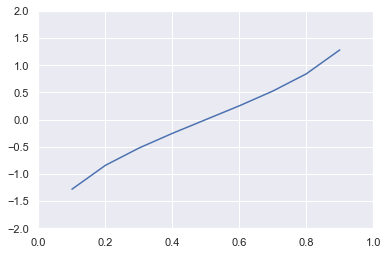

In [67]:
sns.set()
plt.plot(x,y)
plt.xlim(0,1)
plt.ylim(-2,2)

In [101]:
ndtri(0.8)

0.8416212335729143

In [83]:
#j :  5~999
for i in range(1,5+1):
    print(i)
    

1
2
3
4
5


In [57]:
US

,Predicted Path,Actual Return,Expected Return,Expected Return Index,Buy & Hold
2002-11-04,-1,0.008978,-0.00897798,99.1022,100.897798
2002-11-05,-1,0.008388,-0.00838755,98.271,101.744083
2002-11-06,-1,0.009297,-0.00929746,97.3573,102.690045
2002-11-07,-1,-0.023477,0.0234774,99.643,100.279154
2002-11-08,-1,-0.009140,0.00913973,100.554,99.362629
...,...,...,...,...,...
2017-05-25,0,0.004489,0,135.425,NaN
2017-05-26,0,0.000392,0,135.425,NaN
2017-05-29,0,0.000000,0,135.425,NaN
2017-05-30,0,-0.001039,-0,135.425,NaN


In [58]:
R_1

1999-01-01    0.000000
1999-01-04   -0.001153
1999-01-05    0.013031
1999-01-06    0.022038
1999-01-07   -0.000444
                ...   
2017-05-25    0.004489
2017-05-26    0.000392
2017-05-29    0.000000
2017-05-30   -0.001039
2017-05-31   -0.000228
Name: NDDUUS Index, Length: 4804, dtype: float64

In [59]:
R_1[1001:]

2002-11-04    0.008978
2002-11-05    0.008388
2002-11-06    0.009297
2002-11-07   -0.023477
2002-11-08   -0.009140
                ...   
2017-05-25    0.004489
2017-05-26    0.000392
2017-05-29    0.000000
2017-05-30   -0.001039
2017-05-31   -0.000228
Name: NDDUUS Index, Length: 3803, dtype: float64

In [60]:
JP

,Predicted Path,Actual Return,Expected Return,Expected Return Index,Buy & Hold
2002-11-04,0,-0.001798,-0,100,NaN
2002-11-05,0,0.026934,0,100,NaN
2002-11-06,0,-0.003312,-0,100,NaN
2002-11-07,0,0.002321,0,100,NaN
2002-11-08,0,-0.009451,-0,100,NaN
...,...,...,...,...,...
2017-05-25,-1,0.003748,-0.00374752,114.146,143.697383
2017-05-26,-1,0.000309,-0.000309165,114.111,143.741809
2017-05-29,-1,0.000117,-0.000117335,114.097,143.758675
2017-05-30,-1,0.003843,-0.00384272,113.659,144.311099


In [61]:
UK

,Predicted Path,Actual Return,Expected Return,Expected Return Index,Buy & Hold
2006-09-01,1,0.007817,0.00781697,100.782,100.781697
2006-09-04,1,0.006808,0.00680843,101.468,101.467862
2006-09-05,-1,-0.007216,0.00721609,102.2,100.735660
2006-09-06,-1,-0.014519,0.0145191,103.684,99.273070
2006-09-07,-1,-0.015910,0.0159096,105.333,97.693672
...,...,...,...,...,...
2017-05-25,-1,-0.000259,0.00025918,160.932,151.350215
2017-05-26,-1,-0.008303,0.00830305,162.268,150.093546
2017-05-29,-1,0.004018,-0.00401842,161.616,150.696685
2017-05-30,-1,-0.001180,0.00117952,161.807,150.518935


In [63]:
R_3[1001:]

2002-11-04    0.028021
2002-11-05    0.005429
2002-11-06   -0.011681
2002-11-07    0.007212
2002-11-08   -0.004928
                ...   
2017-05-25   -0.000259
2017-05-26   -0.008303
2017-05-29    0.004018
2017-05-30   -0.001180
2017-05-31    0.002854
Name: NDDUUK Index, Length: 3803, dtype: float64